In [1]:
field = 'NW'
max_zoi = 100

In [2]:
# Parameters
field = "NE"


# 6: With the domains, sum the flux within the region boundaries

In [3]:
from dataclasses import replace

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.io import fits
import os

from m33_pipeline import paths
from m33_pipeline.config import get_photometry_config
from m33_pipeline.io import read_catalog, read_fits_data, read_fits_data_header
from m33_pipeline.photometry import build_field_flux_catalog, load_flux_maps, load_integrated_flux_table, load_region_inputs
from m33_pipeline.validate import validate_field_flux_catalog


In [4]:
# Field-level region photometry now lives in m33_pipeline.photometry.
# This notebook keeps the downstream extinction, BPT, and plotting steps.


In [5]:
photometry_config = replace(get_photometry_config(), max_zoi_pc=max_zoi)
merged_df = build_field_flux_catalog(field, max_zoi, photometry_config)

validation_warnings = validate_field_flux_catalog(merged_df, field)
if validation_warnings:
    print("Validation warnings:")
    for warning in validation_warnings:
        print(f"- {warning}")

# Compatibility variables for downstream notebook cells that still expect the old inline setup.
flux_maps = load_flux_maps(field)
ha_flux_data, ha_flux_err_data = flux_maps["Halpha"]
hb_flux_data, hb_flux_err_data = flux_maps["Hbeta"]
oiii_flux_data, oiii_flux_err_data = flux_maps["[OIII]5007"]
sii6716_flux_data, sii6716_flux_err_data = flux_maps["[SII]6716"]
sii6731_flux_data, sii6731_flux_err_data = flux_maps["[SII]6731"]
nii6584_flux_data, nii6584_flux_err_data = flux_maps["[NII]6583"]
oii3727_flux_data, oii3727_flux_err_data = flux_maps["[OII]3727"]

ha_flux_data, ha_flux_header = read_fits_data_header(paths.calibrated_field_map_dir(field) / f"M33{field}-Haflux.fits")
region_inputs = load_region_inputs(field, max_zoi)
peaks_df = region_inputs["peaks_df"]
zoi_map = region_inputs["zoi_map"]
boundary_map = region_inputs["boundary_map"]
boundary_metric_df = region_inputs["boundary_metrics_df"]
int_flux_df = load_integrated_flux_table(field, len(peaks_df))

print("Built field flux catalog:", merged_df.shape)
merged_df.head()


/Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/m33_pipeline/photometry.py:140: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  int_flux_df = pd.read_csv(ascii_path, delim_whitespace=True, comment="#")


Validation warnings:
- NE flux catalog: duplicate values found in region_id
Built field flux catalog: (797, 99)


/Users/emmajarvis/Documents/SIGNALS/M33/PAPER1/m33_pipeline/photometry.py:140: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  int_flux_df = pd.read_csv(ascii_path, delim_whitespace=True, comment="#")


,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Halpha_bgsub,SNR_Halpha_bgsub,F_Hbeta_sum,...,SNR_Halpha_int,F_[NII]6583_int,F_[NII]6583_e_int,SNR_[NII]6583_int,F_[SII]6716_int,F_[SII]6716_e_int,SNR_[SII]6716_int,F_[SII]6731_int,F_[SII]6731_e_int,SNR_[SII]6731_int
0,1.0,135.0,42.0,3.844531e-15,1.329692e-16,28.912932,2.414612e-18,3.518558e-15,26.461443,9.386450e-16,...,26.8,3.596000e-16,1.028000e-16,3.5,-1.040000e-16,1.046000e-16,-1.0,-2.411000e-17,1.048000e-16,-0.2
1,2.0,59.0,30.0,5.798340e-16,2.812283e-17,20.617910,1.190471e-18,5.095962e-16,18.120375,5.392684e-17,...,10.5,2.073000e-15,4.067000e-16,5.6,2.631000e-15,4.340000e-16,6.8,1.772000e-15,4.088000e-16,4.6
2,3.0,144.0,51.0,2.498188e-15,5.459446e-17,45.759010,1.215399e-17,7.480144e-16,13.701288,8.160391e-16,...,8.2,1.368000e-15,3.514000e-16,3.9,8.528000e-16,3.650000e-16,2.3,5.361000e-16,3.671000e-16,1.5
3,4.0,237.0,62.0,2.507776e-15,4.865386e-17,51.543209,6.966539e-18,8.567065e-16,17.608192,7.793838e-16,...,9.4,2.136000e-15,4.873000e-16,4.4,1.423000e-15,5.063000e-16,2.8,7.775000e-16,5.091000e-16,1.5
4,5.0,309.0,70.0,4.247369e-15,5.664677e-17,74.979905,7.992463e-18,1.777698e-15,31.382163,1.191955e-15,...,14.2,1.579000e-15,2.954000e-16,5.7,1.479000e-15,3.016000e-16,5.2,9.944000e-16,2.942000e-16,3.5


In [6]:
print("Regions with npix_region == 0:", (merged_df["npix_region"] == 0).sum())

for line_name in ["Halpha", "Hbeta", "[OIII]5007", "[SII]6716", "[SII]6731", "[NII]6583", "[OII]3727"]:
    n_nan = merged_df[f"{line_name}_b_edge"].isna().sum()
    print(f"{line_name}: NaN edge backgrounds = {n_nan}")

for col in merged_df.columns:
    print(col)


Regions with npix_region == 0: 0
Halpha: NaN edge backgrounds = 2
Hbeta: NaN edge backgrounds = 2
[OIII]5007: NaN edge backgrounds = 2
[SII]6716: NaN edge backgrounds = 2
[SII]6731: NaN edge backgrounds = 2
[NII]6583: NaN edge backgrounds = 2
[OII]3727: NaN edge backgrounds = 2
region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Halpha_bgsub
SNR_Halpha_bgsub
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_Hbeta_bgsub
SNR_Hbeta_bgsub
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[OIII]5007_bgsub
SNR_[OIII]5007_bgsub
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6716_bgsub
SNR_[SII]6716_bgsub
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[SII]6731_bgsub
SNR_[SII]6731_bgsub
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[NII]6583_bgsub
SNR_[NII]6583_bgsub
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
F_[OII]37

In [7]:
# Put your flux and error maps in a dict for looping
maps = {
    "Halpha":      (ha_flux_data, ha_flux_err_data),
    "Hbeta":      (hb_flux_data, hb_flux_err_data),
    "[OIII]5007":(oiii_flux_data, oiii_flux_err_data),
    "[SII]6716": (sii6716_flux_data, sii6716_flux_err_data),
    "[SII]6731": (sii6731_flux_data, sii6731_flux_err_data),
    "[NII]6583": (nii6584_flux_data, nii6584_flux_err_data),
    "[OII]3727": (oii3727_flux_data, oii3727_flux_err_data),
}

# Region labels present in boundary_map (ignore 0, NaNs)
labels = np.unique(boundary_map[np.isfinite(boundary_map)])
labels = labels[labels > 0].astype(int)

print(f"Found {len(labels)} regions (labels > 0). Min={labels.min() if len(labels) else None}, Max={labels.max() if len(labels) else None}")

Found 795 regions (labels > 0). Min=1, Max=797


In [8]:
from tqdm import tqdm
from scipy.ndimage import binary_dilation
def region_edge_ring(region_mask, iterations=1):
    """
    Build an *outer edge ring* just outside the region boundary.

    Exactly:
    - Take region_mask (True inside region)
    - Dilate it by `iterations` pixels
    - Outer ring = dilated_mask & (~region_mask)

    This produces a 1-pixel thick ring outside the region if iterations=1,
    thicker if iterations>1.
    """
    region_mask = np.asarray(region_mask, dtype=bool)
    dil = binary_dilation(region_mask, iterations=iterations)
    ring = dil & (~region_mask)
    return ring

def integrated_flux_and_snr(flux, err, region_mask, ring_mask=None, clip_negative_after_bg=False):
    """
    Compute integrated flux and SNR for a region.

    Definitions used (exact):
    1) Raw integrated flux:
       F_raw = sum_i flux_i  over pixels i inside region_mask

    2) Integrated uncertainty (assuming per-pixel errors are 1-sigma and independent):
       sigma_F = sqrt( sum_i err_i^2 )   over pixels i inside region_mask

    3) Raw SNR:
       SNR_sum = F_raw / sigma_F   (if sigma_F>0 else NaN)

    Background subtraction (if ring_mask provided):
    4) Background level per pixel:
       b = mean_j flux_j over pixels j in ring_mask
       (with NaN-safe mean)

    5) Background-subtracted integrated flux:
       F_bgsub = sum_i (flux_i - b) over region pixels
              = F_raw - b * Npix_region

       Uncertainty remains:
       sigma_F_bgsub = sigma_F
       (i.e., we *do not* add uncertainty from estimating b; if you want that,
        we can include it, but this is the simplest standard approach.)

    6) Background-subtracted SNR:
       SNR_bgsub = F_bgsub / sigma_F  (if sigma_F>0 else NaN)

    Options:
    - clip_negative_after_bg: if True, clip (flux_i - b) at 0 before summing.
      (Default False = physically allows negative after subtraction.)
    """
    flux = np.asarray(flux, dtype=float)
    err  = np.asarray(err, dtype=float)

    inside = region_mask
    f_vals = flux[inside]
    e_vals = err[inside]

    # NaN handling: ignore NaNs in flux; but for error we must also ignore same pixels
    good = np.isfinite(f_vals) & np.isfinite(e_vals)
    f_vals = f_vals[good]
    e_vals = e_vals[good]

    npix = f_vals.size
    if npix == 0:
        return dict(
            npix=0,
            F_raw=np.nan, sigma_F=np.nan, SNR_raw=np.nan,
            b_edge=np.nan, F_bgsub=np.nan, SNR_bgsub=np.nan
        )

    F_raw = np.sum(f_vals)
    sigma_F = np.sqrt(np.sum(e_vals**2))
    SNR_raw = F_raw / sigma_F if sigma_F > 0 else np.nan

    b_edge = np.nan
    F_bgsub = np.nan
    SNR_bgsub = np.nan

    if ring_mask is not None:
        ring_vals = flux[ring_mask]
        ring_vals = ring_vals[np.isfinite(ring_vals)]
        b_edge = np.nanmean(ring_vals) if ring_vals.size > 0 else np.nan

        # background subtract
        if np.isfinite(b_edge):
            if clip_negative_after_bg:
                F_bgsub = np.sum(np.clip(f_vals - b_edge, 0, None))
            else:
                F_bgsub = np.sum(f_vals - b_edge)

            SNR_bgsub = F_bgsub / sigma_F if sigma_F > 0 else np.nan
        else:
            F_bgsub = np.nan
            SNR_bgsub = np.nan

    return dict(
        npix=npix,
        F_raw=F_raw,
        sigma_F=sigma_F,
        SNR_raw=SNR_raw,
        b_edge=b_edge,
        # F_bgsub=F_bgsub,
        # SNR_bgsub=SNR_bgsub
    )

def merge_check_duplicates(left_df, right_df, on, how="left", suffixes=("_x", "_y"), rtol=0, atol=0):
    """
    Merge and resolve duplicate columns:
    - If a column name exists in both (excluding key columns), compare values.
    - If all equal within tolerance -> keep one.
    - If not equal -> keep both with suffixes.

    This expects 'on' to be a list or string key(s).
    """
    if isinstance(on, str):
        on = [on]

    overlap = (set(left_df.columns) & set(right_df.columns)) - set(on)
    merged = left_df.merge(right_df, on=on, how=how, suffixes=suffixes)

    for col in overlap:
        cx = f"{col}{suffixes[0]}"
        cy = f"{col}{suffixes[1]}"
        if cx in merged.columns and cy in merged.columns:
            a = merged[cx].to_numpy()
            b = merged[cy].to_numpy()

            # treat NaNs as equal where both NaN
            both_nan = np.isnan(a) & np.isnan(b) if (np.issubdtype(a.dtype, np.number) and np.issubdtype(b.dtype, np.number)) else np.zeros_like(a, dtype=bool)

            equal = False
            if np.issubdtype(a.dtype, np.number) and np.issubdtype(b.dtype, np.number):
                equal = np.allclose(a[~both_nan], b[~both_nan], rtol=rtol, atol=atol, equal_nan=True)
            else:
                equal = np.all((a == b) | (pd.isna(a) & pd.isna(b)))

            if equal:
                merged[col] = merged[cx]
                merged.drop(columns=[cx, cy], inplace=True)
            else:
                # keep both; do nothing
                pass

    return merged

In [9]:
# Parameters you can tune:
edge_ring_iterations = 1          # thickness of outer ring (pixels)
clip_negative_after_bg = False    # True if you want to force bgsub flux >= 0 per pixel

rows = []

for rid in tqdm(labels, desc="Processing regions"):
    region_mask = (boundary_map == rid)
    ring_mask = region_edge_ring(region_mask, iterations=edge_ring_iterations)

    row = {
        "region_id": rid,
        "npix_region": int(np.sum(region_mask)),
        "npix_edge_ring": int(np.sum(ring_mask)),
    }

    # # optional: store a region-wide average ZoI value (or something else)
    # if 'zoi_map' in globals() and zoi_map is not None:
    #     zvals = zoi_map[region_mask]
    #     zvals = zvals[np.isfinite(zvals)]
    #     row["zoi_mean"] = float(np.nanmean(zvals)) if zvals.size else np.nan
    #     row["zoi_median"] = float(np.nanmedian(zvals)) if zvals.size else np.nan
    # else:
    #     row["zoi_mean"] = np.nan
    #     row["zoi_median"] = np.nan

    for name, (flux, err) in maps.items():
        stats = integrated_flux_and_snr(
            flux=flux,
            err=err,
            region_mask=region_mask,
            ring_mask=ring_mask,
            clip_negative_after_bg=clip_negative_after_bg
        )

        # Write columns in a consistent naming scheme
        row[f"F_{name}_sum"]     = stats["F_raw"]
        row[f"F_{name}_e_sum"]   = stats["sigma_F"]
        row[f"SNR_{name}_sum"]   = stats["SNR_raw"]
        row[f"{name}_b_edge"]    = stats["b_edge"]
        # row[f"{name}_F_bgsub"]   = stats["F_bgsub"]
        # row[f"{name}_SNR_bgsub"] = stats["SNR_bgsub"]

    rows.append(row)

flux_catalog_df = pd.DataFrame(rows).sort_values("region_id").reset_index(drop=True)

flux_catalog_df.head()

Processing regions:   0%|                                                                                                                     | 0/795 [00:00<?, ?it/s]

Processing regions:   0%|▎                                                                                                            | 2/795 [00:00<01:05, 12.15it/s]

Processing regions:   1%|▌                                                                                                            | 4/795 [00:00<00:59, 13.31it/s]

Processing regions:   1%|▊                                                                                                            | 6/795 [00:00<00:57, 13.70it/s]

Processing regions:   1%|█                                                                                                            | 8/795 [00:00<00:56, 13.96it/s]

Processing regions:   1%|█▎                                                                                                          | 10/795 [00:00<00:56, 14.02it/s]

Processing regions:   2%|█▋                                                                                                          | 12/795 [00:00<00:55, 14.13it/s]

Processing regions:   2%|█▉                                                                                                          | 14/795 [00:01<00:54, 14.22it/s]

Processing regions:   2%|██▏                                                                                                         | 16/795 [00:01<00:54, 14.41it/s]

Processing regions:   2%|██▍                                                                                                         | 18/795 [00:01<00:53, 14.41it/s]

Processing regions:   3%|██▋                                                                                                         | 20/795 [00:01<00:54, 14.31it/s]

Processing regions:   3%|██▉                                                                                                         | 22/795 [00:01<00:53, 14.32it/s]

Processing regions:   3%|███▎                                                                                                        | 24/795 [00:01<00:53, 14.39it/s]

Processing regions:   3%|███▌                                                                                                        | 26/795 [00:01<00:53, 14.49it/s]

Processing regions:   4%|███▊                                                                                                        | 28/795 [00:01<00:52, 14.56it/s]

Processing regions:   4%|████                                                                                                        | 30/795 [00:02<00:51, 14.72it/s]

Processing regions:   4%|████▎                                                                                                       | 32/795 [00:02<00:51, 14.88it/s]

Processing regions:   4%|████▌                                                                                                       | 34/795 [00:02<00:50, 15.15it/s]

Processing regions:   5%|████▉                                                                                                       | 36/795 [00:02<00:49, 15.19it/s]

Processing regions:   5%|█████▏                                                                                                      | 38/795 [00:02<00:50, 14.87it/s]

Processing regions:   5%|█████▍                                                                                                      | 40/795 [00:02<00:49, 15.17it/s]

Processing regions:   5%|█████▋                                                                                                      | 42/795 [00:02<00:49, 15.28it/s]

Processing regions:   6%|█████▉                                                                                                      | 44/795 [00:03<00:49, 15.24it/s]

Processing regions:   6%|██████▏                                                                                                     | 46/795 [00:03<00:48, 15.35it/s]

Processing regions:   6%|██████▌                                                                                                     | 48/795 [00:03<00:48, 15.32it/s]

Processing regions:   6%|██████▊                                                                                                     | 50/795 [00:03<00:49, 14.91it/s]

Processing regions:   7%|███████                                                                                                     | 52/795 [00:03<00:50, 14.82it/s]

Processing regions:   7%|███████▎                                                                                                    | 54/795 [00:03<00:50, 14.78it/s]

Processing regions:   7%|███████▌                                                                                                    | 56/795 [00:03<00:50, 14.63it/s]

Processing regions:   7%|███████▉                                                                                                    | 58/795 [00:03<00:50, 14.59it/s]

Processing regions:   8%|████████▏                                                                                                   | 60/795 [00:04<00:49, 14.76it/s]

Processing regions:   8%|████████▍                                                                                                   | 62/795 [00:04<00:48, 15.01it/s]

Processing regions:   8%|████████▋                                                                                                   | 64/795 [00:04<00:48, 15.19it/s]

Processing regions:   8%|████████▉                                                                                                   | 66/795 [00:04<00:47, 15.34it/s]

Processing regions:   9%|█████████▏                                                                                                  | 68/795 [00:04<00:47, 15.41it/s]

Processing regions:   9%|█████████▌                                                                                                  | 70/795 [00:04<00:47, 15.15it/s]

Processing regions:   9%|█████████▊                                                                                                  | 72/795 [00:04<00:47, 15.16it/s]

Processing regions:   9%|██████████                                                                                                  | 74/795 [00:05<00:46, 15.39it/s]

Processing regions:  10%|██████████▎                                                                                                 | 76/795 [00:05<00:46, 15.49it/s]

Processing regions:  10%|██████████▌                                                                                                 | 78/795 [00:05<00:46, 15.52it/s]

Processing regions:  10%|██████████▊                                                                                                 | 80/795 [00:05<00:46, 15.48it/s]

Processing regions:  10%|███████████▏                                                                                                | 82/795 [00:05<00:45, 15.53it/s]

Processing regions:  11%|███████████▍                                                                                                | 84/795 [00:05<00:45, 15.58it/s]

Processing regions:  11%|███████████▋                                                                                                | 86/795 [00:05<00:45, 15.65it/s]

Processing regions:  11%|███████████▉                                                                                                | 88/795 [00:05<00:44, 15.72it/s]

Processing regions:  11%|████████████▏                                                                                               | 90/795 [00:06<00:44, 15.78it/s]

Processing regions:  12%|████████████▍                                                                                               | 92/795 [00:06<00:44, 15.72it/s]

Processing regions:  12%|████████████▊                                                                                               | 94/795 [00:06<00:44, 15.66it/s]

Processing regions:  12%|█████████████                                                                                               | 96/795 [00:06<00:44, 15.70it/s]

Processing regions:  12%|█████████████▎                                                                                              | 98/795 [00:06<00:44, 15.71it/s]

Processing regions:  13%|█████████████▍                                                                                             | 100/795 [00:06<00:44, 15.69it/s]

Processing regions:  13%|█████████████▋                                                                                             | 102/795 [00:06<00:44, 15.47it/s]

Processing regions:  13%|█████████████▉                                                                                             | 104/795 [00:06<00:44, 15.59it/s]

Processing regions:  13%|██████████████▎                                                                                            | 106/795 [00:07<00:44, 15.58it/s]

Processing regions:  14%|██████████████▌                                                                                            | 108/795 [00:07<00:44, 15.55it/s]

Processing regions:  14%|██████████████▊                                                                                            | 110/795 [00:07<00:43, 15.74it/s]

Processing regions:  14%|███████████████                                                                                            | 112/795 [00:07<00:43, 15.79it/s]

Processing regions:  14%|███████████████▎                                                                                           | 114/795 [00:07<00:43, 15.67it/s]

Processing regions:  15%|███████████████▌                                                                                           | 116/795 [00:07<00:43, 15.72it/s]

Processing regions:  15%|███████████████▉                                                                                           | 118/795 [00:07<00:43, 15.68it/s]

Processing regions:  15%|████████████████▏                                                                                          | 120/795 [00:07<00:43, 15.61it/s]

Processing regions:  15%|████████████████▍                                                                                          | 122/795 [00:08<00:42, 15.66it/s]

Processing regions:  16%|████████████████▋                                                                                          | 124/795 [00:08<00:42, 15.64it/s]

Processing regions:  16%|████████████████▉                                                                                          | 126/795 [00:08<00:42, 15.68it/s]

Processing regions:  16%|█████████████████▏                                                                                         | 128/795 [00:08<00:43, 15.48it/s]

Processing regions:  16%|█████████████████▍                                                                                         | 130/795 [00:08<00:43, 15.32it/s]

Processing regions:  17%|█████████████████▊                                                                                         | 132/795 [00:08<00:43, 15.38it/s]

Processing regions:  17%|██████████████████                                                                                         | 134/795 [00:08<00:42, 15.53it/s]

Processing regions:  17%|██████████████████▎                                                                                        | 136/795 [00:08<00:42, 15.55it/s]

Processing regions:  17%|██████████████████▌                                                                                        | 138/795 [00:09<00:42, 15.57it/s]

Processing regions:  18%|██████████████████▊                                                                                        | 140/795 [00:09<00:42, 15.41it/s]

Processing regions:  18%|███████████████████                                                                                        | 142/795 [00:09<00:42, 15.44it/s]

Processing regions:  18%|███████████████████▍                                                                                       | 144/795 [00:09<00:41, 15.52it/s]

Processing regions:  18%|███████████████████▋                                                                                       | 146/795 [00:09<00:41, 15.57it/s]

Processing regions:  19%|███████████████████▉                                                                                       | 148/795 [00:09<00:41, 15.51it/s]

Processing regions:  19%|████████████████████▏                                                                                      | 150/795 [00:09<00:41, 15.57it/s]

Processing regions:  19%|████████████████████▍                                                                                      | 152/795 [00:10<00:41, 15.61it/s]

Processing regions:  19%|████████████████████▋                                                                                      | 154/795 [00:10<00:41, 15.55it/s]

Processing regions:  20%|████████████████████▉                                                                                      | 156/795 [00:10<00:41, 15.52it/s]

Processing regions:  20%|█████████████████████▎                                                                                     | 158/795 [00:10<00:40, 15.70it/s]

Processing regions:  20%|█████████████████████▌                                                                                     | 160/795 [00:10<00:40, 15.61it/s]

Processing regions:  20%|█████████████████████▊                                                                                     | 162/795 [00:10<00:40, 15.61it/s]

Processing regions:  21%|██████████████████████                                                                                     | 164/795 [00:10<00:40, 15.70it/s]

Processing regions:  21%|██████████████████████▎                                                                                    | 166/795 [00:10<00:40, 15.64it/s]

Processing regions:  21%|██████████████████████▌                                                                                    | 168/795 [00:11<00:40, 15.62it/s]

Processing regions:  21%|██████████████████████▉                                                                                    | 170/795 [00:11<00:40, 15.57it/s]

Processing regions:  22%|███████████████████████▏                                                                                   | 172/795 [00:11<00:40, 15.44it/s]

Processing regions:  22%|███████████████████████▍                                                                                   | 174/795 [00:11<00:41, 15.12it/s]

Processing regions:  22%|███████████████████████▋                                                                                   | 176/795 [00:11<00:41, 14.82it/s]

Processing regions:  22%|███████████████████████▉                                                                                   | 178/795 [00:11<00:42, 14.60it/s]

Processing regions:  23%|████████████████████████▏                                                                                  | 180/795 [00:11<00:41, 14.80it/s]

Processing regions:  23%|████████████████████████▍                                                                                  | 182/795 [00:11<00:40, 15.00it/s]

Processing regions:  23%|████████████████████████▊                                                                                  | 184/795 [00:12<00:41, 14.89it/s]

Processing regions:  23%|█████████████████████████                                                                                  | 186/795 [00:12<00:41, 14.62it/s]

Processing regions:  24%|█████████████████████████▎                                                                                 | 188/795 [00:12<00:41, 14.60it/s]

Processing regions:  24%|█████████████████████████▌                                                                                 | 190/795 [00:12<00:40, 14.77it/s]

Processing regions:  24%|█████████████████████████▊                                                                                 | 192/795 [00:12<00:40, 14.95it/s]

Processing regions:  24%|██████████████████████████                                                                                 | 194/795 [00:12<00:39, 15.16it/s]

Processing regions:  25%|██████████████████████████▍                                                                                | 196/795 [00:12<00:40, 14.64it/s]

Processing regions:  25%|██████████████████████████▋                                                                                | 198/795 [00:13<00:39, 14.93it/s]

Processing regions:  25%|██████████████████████████▉                                                                                | 200/795 [00:13<00:39, 15.15it/s]

Processing regions:  25%|███████████████████████████▏                                                                               | 202/795 [00:13<00:38, 15.26it/s]

Processing regions:  26%|███████████████████████████▍                                                                               | 204/795 [00:13<00:38, 15.43it/s]

Processing regions:  26%|███████████████████████████▋                                                                               | 206/795 [00:13<00:38, 15.50it/s]

Processing regions:  26%|███████████████████████████▉                                                                               | 208/795 [00:13<00:37, 15.67it/s]

Processing regions:  26%|████████████████████████████▎                                                                              | 210/795 [00:13<00:37, 15.64it/s]

Processing regions:  27%|████████████████████████████▌                                                                              | 212/795 [00:13<00:37, 15.68it/s]

Processing regions:  27%|████████████████████████████▊                                                                              | 214/795 [00:14<00:37, 15.67it/s]

Processing regions:  27%|█████████████████████████████                                                                              | 216/795 [00:14<00:36, 15.68it/s]

Processing regions:  27%|█████████████████████████████▎                                                                             | 218/795 [00:14<00:36, 15.72it/s]

Processing regions:  28%|█████████████████████████████▌                                                                             | 220/795 [00:14<00:36, 15.76it/s]

Processing regions:  28%|█████████████████████████████▉                                                                             | 222/795 [00:14<00:36, 15.63it/s]

Processing regions:  28%|██████████████████████████████▏                                                                            | 224/795 [00:14<00:36, 15.62it/s]

Processing regions:  28%|██████████████████████████████▍                                                                            | 226/795 [00:14<00:36, 15.68it/s]

Processing regions:  29%|██████████████████████████████▋                                                                            | 228/795 [00:14<00:36, 15.69it/s]

Processing regions:  29%|██████████████████████████████▉                                                                            | 230/795 [00:15<00:36, 15.68it/s]

Processing regions:  29%|███████████████████████████████▏                                                                           | 232/795 [00:15<00:35, 15.65it/s]

Processing regions:  29%|███████████████████████████████▍                                                                           | 234/795 [00:15<00:36, 15.55it/s]

Processing regions:  30%|███████████████████████████████▊                                                                           | 236/795 [00:15<00:35, 15.55it/s]

Processing regions:  30%|████████████████████████████████                                                                           | 238/795 [00:15<00:35, 15.67it/s]

Processing regions:  30%|████████████████████████████████▎                                                                          | 240/795 [00:15<00:35, 15.71it/s]

Processing regions:  30%|████████████████████████████████▌                                                                          | 242/795 [00:15<00:35, 15.74it/s]

Processing regions:  31%|████████████████████████████████▊                                                                          | 244/795 [00:15<00:34, 15.80it/s]

Processing regions:  31%|█████████████████████████████████                                                                          | 246/795 [00:16<00:34, 15.88it/s]

Processing regions:  31%|█████████████████████████████████▍                                                                         | 248/795 [00:16<00:34, 15.90it/s]

Processing regions:  31%|█████████████████████████████████▋                                                                         | 250/795 [00:16<00:34, 15.85it/s]

Processing regions:  32%|█████████████████████████████████▉                                                                         | 252/795 [00:16<00:34, 15.78it/s]

Processing regions:  32%|██████████████████████████████████▏                                                                        | 254/795 [00:16<00:34, 15.68it/s]

Processing regions:  32%|██████████████████████████████████▍                                                                        | 256/795 [00:16<00:34, 15.67it/s]

Processing regions:  32%|██████████████████████████████████▋                                                                        | 258/795 [00:16<00:34, 15.69it/s]

Processing regions:  33%|██████████████████████████████████▉                                                                        | 260/795 [00:17<00:34, 15.69it/s]

Processing regions:  33%|███████████████████████████████████▎                                                                       | 262/795 [00:17<00:34, 15.65it/s]

Processing regions:  33%|███████████████████████████████████▌                                                                       | 264/795 [00:17<00:34, 15.53it/s]

Processing regions:  33%|███████████████████████████████████▊                                                                       | 266/795 [00:17<00:34, 15.42it/s]

Processing regions:  34%|████████████████████████████████████                                                                       | 268/795 [00:17<00:33, 15.52it/s]

Processing regions:  34%|████████████████████████████████████▎                                                                      | 270/795 [00:17<00:34, 15.28it/s]

Processing regions:  34%|████████████████████████████████████▌                                                                      | 272/795 [00:17<00:34, 15.00it/s]

Processing regions:  34%|████████████████████████████████████▉                                                                      | 274/795 [00:17<00:34, 15.25it/s]

Processing regions:  35%|█████████████████████████████████████▏                                                                     | 276/795 [00:18<00:33, 15.37it/s]

Processing regions:  35%|█████████████████████████████████████▍                                                                     | 278/795 [00:18<00:33, 15.53it/s]

Processing regions:  35%|█████████████████████████████████████▋                                                                     | 280/795 [00:18<00:33, 15.55it/s]

Processing regions:  35%|█████████████████████████████████████▉                                                                     | 282/795 [00:18<00:33, 15.51it/s]

Processing regions:  36%|██████████████████████████████████████▏                                                                    | 284/795 [00:18<00:33, 15.45it/s]

Processing regions:  36%|██████████████████████████████████████▍                                                                    | 286/795 [00:18<00:32, 15.50it/s]

Processing regions:  36%|██████████████████████████████████████▊                                                                    | 288/795 [00:18<00:32, 15.54it/s]

Processing regions:  36%|███████████████████████████████████████                                                                    | 290/795 [00:18<00:32, 15.69it/s]

Processing regions:  37%|███████████████████████████████████████▎                                                                   | 292/795 [00:19<00:31, 15.72it/s]

Processing regions:  37%|███████████████████████████████████████▌                                                                   | 294/795 [00:19<00:31, 15.67it/s]

Processing regions:  37%|███████████████████████████████████████▊                                                                   | 296/795 [00:19<00:32, 15.52it/s]

Processing regions:  37%|████████████████████████████████████████                                                                   | 298/795 [00:19<00:33, 15.03it/s]

Processing regions:  38%|████████████████████████████████████████▍                                                                  | 300/795 [00:19<00:33, 14.93it/s]

Processing regions:  38%|████████████████████████████████████████▋                                                                  | 302/795 [00:19<00:32, 15.18it/s]

Processing regions:  38%|████████████████████████████████████████▉                                                                  | 304/795 [00:19<00:31, 15.37it/s]

Processing regions:  38%|█████████████████████████████████████████▏                                                                 | 306/795 [00:19<00:31, 15.55it/s]

Processing regions:  39%|█████████████████████████████████████████▍                                                                 | 308/795 [00:20<00:31, 15.54it/s]

Processing regions:  39%|█████████████████████████████████████████▋                                                                 | 310/795 [00:20<00:31, 15.56it/s]

Processing regions:  39%|█████████████████████████████████████████▉                                                                 | 312/795 [00:20<00:30, 15.60it/s]

Processing regions:  39%|██████████████████████████████████████████▎                                                                | 314/795 [00:20<00:30, 15.66it/s]

Processing regions:  40%|██████████████████████████████████████████▌                                                                | 316/795 [00:20<00:30, 15.80it/s]

Processing regions:  40%|██████████████████████████████████████████▊                                                                | 318/795 [00:20<00:30, 15.78it/s]

Processing regions:  40%|███████████████████████████████████████████                                                                | 320/795 [00:20<00:30, 15.81it/s]

Processing regions:  41%|███████████████████████████████████████████▎                                                               | 322/795 [00:21<00:30, 15.73it/s]

Processing regions:  41%|███████████████████████████████████████████▌                                                               | 324/795 [00:21<00:30, 15.68it/s]

Processing regions:  41%|███████████████████████████████████████████▉                                                               | 326/795 [00:21<00:29, 15.66it/s]

Processing regions:  41%|████████████████████████████████████████████▏                                                              | 328/795 [00:21<00:29, 15.77it/s]

Processing regions:  42%|████████████████████████████████████████████▍                                                              | 330/795 [00:21<00:29, 15.74it/s]

Processing regions:  42%|████████████████████████████████████████████▋                                                              | 332/795 [00:21<00:29, 15.59it/s]

Processing regions:  42%|████████████████████████████████████████████▉                                                              | 334/795 [00:21<00:29, 15.53it/s]

Processing regions:  42%|█████████████████████████████████████████████▏                                                             | 336/795 [00:21<00:29, 15.65it/s]

Processing regions:  43%|█████████████████████████████████████████████▍                                                             | 338/795 [00:22<00:29, 15.65it/s]

Processing regions:  43%|█████████████████████████████████████████████▊                                                             | 340/795 [00:22<00:29, 15.66it/s]

Processing regions:  43%|██████████████████████████████████████████████                                                             | 342/795 [00:22<00:29, 15.57it/s]

Processing regions:  43%|██████████████████████████████████████████████▎                                                            | 344/795 [00:22<00:29, 15.47it/s]

Processing regions:  44%|██████████████████████████████████████████████▌                                                            | 346/795 [00:22<00:28, 15.55it/s]

Processing regions:  44%|██████████████████████████████████████████████▊                                                            | 348/795 [00:22<00:28, 15.57it/s]

Processing regions:  44%|███████████████████████████████████████████████                                                            | 350/795 [00:22<00:28, 15.58it/s]

Processing regions:  44%|███████████████████████████████████████████████▍                                                           | 352/795 [00:22<00:28, 15.59it/s]

Processing regions:  45%|███████████████████████████████████████████████▋                                                           | 354/795 [00:23<00:28, 15.68it/s]

Processing regions:  45%|███████████████████████████████████████████████▉                                                           | 356/795 [00:23<00:28, 15.52it/s]

Processing regions:  45%|████████████████████████████████████████████████▏                                                          | 358/795 [00:23<00:28, 15.39it/s]

Processing regions:  45%|████████████████████████████████████████████████▍                                                          | 360/795 [00:23<00:28, 15.36it/s]

Processing regions:  46%|████████████████████████████████████████████████▋                                                          | 362/795 [00:23<00:28, 15.42it/s]

Processing regions:  46%|████████████████████████████████████████████████▉                                                          | 364/795 [00:23<00:27, 15.54it/s]

Processing regions:  46%|█████████████████████████████████████████████████▎                                                         | 366/795 [00:23<00:27, 15.62it/s]

Processing regions:  46%|█████████████████████████████████████████████████▌                                                         | 368/795 [00:23<00:27, 15.64it/s]

Processing regions:  47%|█████████████████████████████████████████████████▊                                                         | 370/795 [00:24<00:27, 15.68it/s]

Processing regions:  47%|██████████████████████████████████████████████████                                                         | 372/795 [00:24<00:26, 15.67it/s]

Processing regions:  47%|██████████████████████████████████████████████████▎                                                        | 374/795 [00:24<00:26, 15.68it/s]

Processing regions:  47%|██████████████████████████████████████████████████▌                                                        | 376/795 [00:24<00:26, 15.54it/s]

Processing regions:  48%|██████████████████████████████████████████████████▉                                                        | 378/795 [00:24<00:27, 15.13it/s]

Processing regions:  48%|███████████████████████████████████████████████████▏                                                       | 380/795 [00:24<00:27, 15.26it/s]

Processing regions:  48%|███████████████████████████████████████████████████▍                                                       | 382/795 [00:24<00:26, 15.46it/s]

Processing regions:  48%|███████████████████████████████████████████████████▋                                                       | 384/795 [00:24<00:26, 15.40it/s]

Processing regions:  49%|███████████████████████████████████████████████████▉                                                       | 386/795 [00:25<00:27, 15.13it/s]

Processing regions:  49%|████████████████████████████████████████████████████▏                                                      | 388/795 [00:25<00:27, 14.92it/s]

Processing regions:  49%|████████████████████████████████████████████████████▍                                                      | 390/795 [00:25<00:27, 14.83it/s]

Processing regions:  49%|████████████████████████████████████████████████████▊                                                      | 392/795 [00:25<00:27, 14.79it/s]

Processing regions:  50%|█████████████████████████████████████████████████████                                                      | 394/795 [00:25<00:27, 14.67it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▎                                                     | 396/795 [00:25<00:27, 14.61it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▌                                                     | 398/795 [00:25<00:26, 14.92it/s]

Processing regions:  50%|█████████████████████████████████████████████████████▊                                                     | 400/795 [00:26<00:25, 15.23it/s]

Processing regions:  51%|██████████████████████████████████████████████████████                                                     | 402/795 [00:26<00:25, 15.42it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▎                                                    | 404/795 [00:26<00:25, 15.59it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▋                                                    | 406/795 [00:26<00:24, 15.57it/s]

Processing regions:  51%|██████████████████████████████████████████████████████▉                                                    | 408/795 [00:26<00:24, 15.54it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▏                                                   | 410/795 [00:26<00:24, 15.59it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▍                                                   | 412/795 [00:26<00:25, 15.31it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▋                                                   | 414/795 [00:26<00:25, 15.10it/s]

Processing regions:  52%|███████████████████████████████████████████████████████▉                                                   | 416/795 [00:27<00:25, 14.99it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▎                                                  | 418/795 [00:27<00:25, 14.84it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▌                                                  | 420/795 [00:27<00:25, 14.75it/s]

Processing regions:  53%|████████████████████████████████████████████████████████▊                                                  | 422/795 [00:27<00:25, 14.80it/s]

Processing regions:  53%|█████████████████████████████████████████████████████████                                                  | 424/795 [00:27<00:25, 14.73it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▎                                                 | 426/795 [00:27<00:25, 14.66it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▌                                                 | 428/795 [00:27<00:24, 14.76it/s]

Processing regions:  54%|█████████████████████████████████████████████████████████▊                                                 | 430/795 [00:28<00:24, 14.72it/s]

Processing regions:  54%|██████████████████████████████████████████████████████████▏                                                | 432/795 [00:28<00:24, 14.64it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▍                                                | 434/795 [00:28<00:24, 14.86it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▋                                                | 436/795 [00:28<00:23, 15.10it/s]

Processing regions:  55%|██████████████████████████████████████████████████████████▉                                                | 438/795 [00:28<00:23, 15.18it/s]

Processing regions:  55%|███████████████████████████████████████████████████████████▏                                               | 440/795 [00:28<00:23, 15.38it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▍                                               | 442/795 [00:28<00:23, 15.17it/s]

Processing regions:  56%|███████████████████████████████████████████████████████████▊                                               | 444/795 [00:29<00:23, 14.78it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████                                               | 446/795 [00:29<00:23, 15.09it/s]

Processing regions:  56%|████████████████████████████████████████████████████████████▎                                              | 448/795 [00:29<00:22, 15.17it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▌                                              | 450/795 [00:29<00:23, 14.93it/s]

Processing regions:  57%|████████████████████████████████████████████████████████████▊                                              | 452/795 [00:29<00:23, 14.81it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████                                              | 454/795 [00:29<00:22, 15.12it/s]

Processing regions:  57%|█████████████████████████████████████████████████████████████▎                                             | 456/795 [00:29<00:22, 15.28it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▋                                             | 458/795 [00:29<00:21, 15.36it/s]

Processing regions:  58%|█████████████████████████████████████████████████████████████▉                                             | 460/795 [00:30<00:21, 15.45it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████▏                                            | 462/795 [00:30<00:21, 15.51it/s]

Processing regions:  58%|██████████████████████████████████████████████████████████████▍                                            | 464/795 [00:30<00:21, 15.54it/s]

Processing regions:  59%|██████████████████████████████████████████████████████████████▋                                            | 466/795 [00:30<00:21, 15.63it/s]

Processing regions:  59%|██████████████████████████████████████████████████████████████▉                                            | 468/795 [00:30<00:20, 15.69it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▎                                           | 470/795 [00:30<00:20, 15.70it/s]

Processing regions:  59%|███████████████████████████████████████████████████████████████▌                                           | 472/795 [00:30<00:20, 15.74it/s]

Processing regions:  60%|███████████████████████████████████████████████████████████████▊                                           | 474/795 [00:30<00:20, 15.68it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████                                           | 476/795 [00:31<00:20, 15.74it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▎                                          | 478/795 [00:31<00:20, 15.71it/s]

Processing regions:  60%|████████████████████████████████████████████████████████████████▌                                          | 480/795 [00:31<00:20, 15.72it/s]

Processing regions:  61%|████████████████████████████████████████████████████████████████▊                                          | 482/795 [00:31<00:20, 15.65it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▏                                         | 484/795 [00:31<00:20, 15.55it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▍                                         | 486/795 [00:31<00:19, 15.55it/s]

Processing regions:  61%|█████████████████████████████████████████████████████████████████▋                                         | 488/795 [00:31<00:19, 15.69it/s]

Processing regions:  62%|█████████████████████████████████████████████████████████████████▉                                         | 490/795 [00:31<00:19, 15.78it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▏                                        | 492/795 [00:32<00:19, 15.80it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▍                                        | 494/795 [00:32<00:19, 15.80it/s]

Processing regions:  62%|██████████████████████████████████████████████████████████████████▊                                        | 496/795 [00:32<00:18, 15.78it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████                                        | 498/795 [00:32<00:18, 15.68it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▎                                       | 500/795 [00:32<00:19, 15.47it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▌                                       | 502/795 [00:32<00:18, 15.49it/s]

Processing regions:  63%|███████████████████████████████████████████████████████████████████▊                                       | 504/795 [00:32<00:18, 15.52it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████                                       | 506/795 [00:32<00:18, 15.52it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▎                                      | 508/795 [00:33<00:18, 15.51it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▋                                      | 510/795 [00:33<00:18, 15.29it/s]

Processing regions:  64%|████████████████████████████████████████████████████████████████████▉                                      | 512/795 [00:33<00:18, 14.91it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▏                                     | 514/795 [00:33<00:18, 14.93it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▍                                     | 516/795 [00:33<00:18, 15.11it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▋                                     | 518/795 [00:33<00:18, 15.26it/s]

Processing regions:  65%|█████████████████████████████████████████████████████████████████████▉                                     | 520/795 [00:33<00:17, 15.37it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▎                                    | 522/795 [00:34<00:17, 15.44it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▌                                    | 524/795 [00:34<00:17, 15.40it/s]

Processing regions:  66%|██████████████████████████████████████████████████████████████████████▊                                    | 526/795 [00:34<00:17, 15.51it/s]

Processing regions:  66%|███████████████████████████████████████████████████████████████████████                                    | 528/795 [00:34<00:17, 15.40it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▎                                   | 530/795 [00:34<00:17, 15.52it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▌                                   | 532/795 [00:34<00:16, 15.62it/s]

Processing regions:  67%|███████████████████████████████████████████████████████████████████████▊                                   | 534/795 [00:34<00:16, 15.56it/s]

Processing regions:  67%|████████████████████████████████████████████████████████████████████████▏                                  | 536/795 [00:34<00:16, 15.52it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▍                                  | 538/795 [00:35<00:16, 15.63it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▋                                  | 540/795 [00:35<00:16, 15.68it/s]

Processing regions:  68%|████████████████████████████████████████████████████████████████████████▉                                  | 542/795 [00:35<00:16, 15.61it/s]

Processing regions:  68%|█████████████████████████████████████████████████████████████████████████▏                                 | 544/795 [00:35<00:16, 15.54it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▍                                 | 546/795 [00:35<00:16, 15.54it/s]

Processing regions:  69%|█████████████████████████████████████████████████████████████████████████▊                                 | 548/795 [00:35<00:15, 15.60it/s]

Processing regions:  69%|██████████████████████████████████████████████████████████████████████████                                 | 550/795 [00:35<00:15, 15.54it/s]

Processing regions:  69%|██████████████████████████████████████████████████████████████████████████▎                                | 552/795 [00:35<00:15, 15.59it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▌                                | 554/795 [00:36<00:15, 15.63it/s]

Processing regions:  70%|██████████████████████████████████████████████████████████████████████████▊                                | 556/795 [00:36<00:15, 15.50it/s]

Processing regions:  70%|███████████████████████████████████████████████████████████████████████████                                | 558/795 [00:36<00:15, 15.51it/s]

Processing regions:  70%|███████████████████████████████████████████████████████████████████████████▎                               | 560/795 [00:36<00:15, 15.64it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▋                               | 562/795 [00:36<00:14, 15.63it/s]

Processing regions:  71%|███████████████████████████████████████████████████████████████████████████▉                               | 564/795 [00:36<00:14, 15.52it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████▏                              | 566/795 [00:36<00:14, 15.46it/s]

Processing regions:  71%|████████████████████████████████████████████████████████████████████████████▍                              | 568/795 [00:36<00:14, 15.49it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▋                              | 570/795 [00:37<00:14, 15.56it/s]

Processing regions:  72%|████████████████████████████████████████████████████████████████████████████▉                              | 572/795 [00:37<00:14, 15.51it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████▎                             | 574/795 [00:37<00:14, 15.40it/s]

Processing regions:  72%|█████████████████████████████████████████████████████████████████████████████▌                             | 576/795 [00:37<00:14, 15.46it/s]

Processing regions:  73%|█████████████████████████████████████████████████████████████████████████████▊                             | 578/795 [00:37<00:13, 15.62it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████                             | 580/795 [00:37<00:13, 15.67it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▎                            | 582/795 [00:37<00:13, 15.66it/s]

Processing regions:  73%|██████████████████████████████████████████████████████████████████████████████▌                            | 584/795 [00:38<00:13, 15.61it/s]

Processing regions:  74%|██████████████████████████████████████████████████████████████████████████████▊                            | 586/795 [00:38<00:13, 15.68it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▏                           | 588/795 [00:38<00:13, 15.36it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▍                           | 590/795 [00:38<00:13, 15.00it/s]

Processing regions:  74%|███████████████████████████████████████████████████████████████████████████████▋                           | 592/795 [00:38<00:13, 14.88it/s]

Processing regions:  75%|███████████████████████████████████████████████████████████████████████████████▉                           | 594/795 [00:38<00:13, 14.74it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▏                          | 596/795 [00:38<00:13, 14.69it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▍                          | 598/795 [00:38<00:13, 14.73it/s]

Processing regions:  75%|████████████████████████████████████████████████████████████████████████████████▊                          | 600/795 [00:39<00:12, 15.05it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████                          | 602/795 [00:39<00:12, 15.20it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▎                         | 604/795 [00:39<00:12, 15.44it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▌                         | 606/795 [00:39<00:12, 15.49it/s]

Processing regions:  76%|█████████████████████████████████████████████████████████████████████████████████▊                         | 608/795 [00:39<00:12, 15.47it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████                         | 610/795 [00:39<00:11, 15.57it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▎                        | 612/795 [00:39<00:11, 15.62it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▋                        | 614/795 [00:39<00:11, 15.69it/s]

Processing regions:  77%|██████████████████████████████████████████████████████████████████████████████████▉                        | 616/795 [00:40<00:11, 15.66it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▏                       | 618/795 [00:40<00:11, 15.69it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▍                       | 620/795 [00:40<00:11, 15.76it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▋                       | 622/795 [00:40<00:11, 15.67it/s]

Processing regions:  78%|███████████████████████████████████████████████████████████████████████████████████▉                       | 624/795 [00:40<00:10, 15.79it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▎                      | 626/795 [00:40<00:10, 15.72it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▌                      | 628/795 [00:40<00:10, 15.71it/s]

Processing regions:  79%|████████████████████████████████████████████████████████████████████████████████████▊                      | 630/795 [00:41<00:10, 15.74it/s]

Processing regions:  79%|█████████████████████████████████████████████████████████████████████████████████████                      | 632/795 [00:41<00:10, 15.76it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▎                     | 634/795 [00:41<00:10, 15.70it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▌                     | 636/795 [00:41<00:10, 15.63it/s]

Processing regions:  80%|█████████████████████████████████████████████████████████████████████████████████████▊                     | 638/795 [00:41<00:10, 15.67it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▏                    | 640/795 [00:41<00:09, 15.73it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▍                    | 642/795 [00:41<00:09, 15.82it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▋                    | 644/795 [00:41<00:09, 15.77it/s]

Processing regions:  81%|██████████████████████████████████████████████████████████████████████████████████████▉                    | 646/795 [00:42<00:09, 15.84it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▏                   | 648/795 [00:42<00:09, 15.89it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▍                   | 650/795 [00:42<00:09, 15.89it/s]

Processing regions:  82%|███████████████████████████████████████████████████████████████████████████████████████▊                   | 652/795 [00:42<00:09, 15.74it/s]

Processing regions:  82%|████████████████████████████████████████████████████████████████████████████████████████                   | 654/795 [00:42<00:08, 15.68it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▎                  | 656/795 [00:42<00:08, 15.60it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▌                  | 658/795 [00:42<00:08, 15.68it/s]

Processing regions:  83%|████████████████████████████████████████████████████████████████████████████████████████▊                  | 660/795 [00:42<00:08, 15.70it/s]

Processing regions:  83%|█████████████████████████████████████████████████████████████████████████████████████████                  | 662/795 [00:43<00:08, 15.76it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▎                 | 664/795 [00:43<00:08, 15.47it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▋                 | 666/795 [00:43<00:08, 15.08it/s]

Processing regions:  84%|█████████████████████████████████████████████████████████████████████████████████████████▉                 | 668/795 [00:43<00:08, 14.77it/s]

Processing regions:  84%|██████████████████████████████████████████████████████████████████████████████████████████▏                | 670/795 [00:43<00:08, 14.64it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▍                | 672/795 [00:43<00:08, 14.57it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▋                | 674/795 [00:43<00:08, 14.76it/s]

Processing regions:  85%|██████████████████████████████████████████████████████████████████████████████████████████▉                | 676/795 [00:43<00:07, 14.97it/s]

Processing regions:  85%|███████████████████████████████████████████████████████████████████████████████████████████▎               | 678/795 [00:44<00:07, 15.19it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▌               | 680/795 [00:44<00:07, 15.30it/s]

Processing regions:  86%|███████████████████████████████████████████████████████████████████████████████████████████▊               | 682/795 [00:44<00:07, 15.21it/s]

Processing regions:  86%|████████████████████████████████████████████████████████████████████████████████████████████               | 684/795 [00:44<00:07, 15.26it/s]

Processing regions:  86%|████████████████████████████████████████████████████████████████████████████████████████████▎              | 686/795 [00:44<00:07, 15.36it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▌              | 688/795 [00:44<00:06, 15.49it/s]

Processing regions:  87%|████████████████████████████████████████████████████████████████████████████████████████████▊              | 690/795 [00:44<00:06, 15.44it/s]

Processing regions:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▏             | 692/795 [00:45<00:06, 15.58it/s]

Processing regions:  87%|█████████████████████████████████████████████████████████████████████████████████████████████▍             | 694/795 [00:45<00:06, 15.74it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▋             | 696/795 [00:45<00:06, 15.75it/s]

Processing regions:  88%|█████████████████████████████████████████████████████████████████████████████████████████████▉             | 698/795 [00:45<00:06, 15.76it/s]

Processing regions:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▏            | 700/795 [00:45<00:06, 15.65it/s]

Processing regions:  88%|██████████████████████████████████████████████████████████████████████████████████████████████▍            | 702/795 [00:45<00:05, 15.64it/s]

Processing regions:  89%|██████████████████████████████████████████████████████████████████████████████████████████████▊            | 704/795 [00:45<00:05, 15.43it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████            | 706/795 [00:45<00:05, 15.01it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▎           | 708/795 [00:46<00:05, 14.78it/s]

Processing regions:  89%|███████████████████████████████████████████████████████████████████████████████████████████████▌           | 710/795 [00:46<00:05, 14.63it/s]

Processing regions:  90%|███████████████████████████████████████████████████████████████████████████████████████████████▊           | 712/795 [00:46<00:05, 14.50it/s]

Processing regions:  90%|████████████████████████████████████████████████████████████████████████████████████████████████           | 714/795 [00:46<00:05, 14.40it/s]

Processing regions:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▎          | 716/795 [00:46<00:05, 14.46it/s]

Processing regions:  90%|████████████████████████████████████████████████████████████████████████████████████████████████▋          | 718/795 [00:46<00:05, 14.58it/s]

Processing regions:  91%|████████████████████████████████████████████████████████████████████████████████████████████████▉          | 720/795 [00:46<00:05, 14.87it/s]

Processing regions:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████▏         | 722/795 [00:47<00:04, 14.98it/s]

Processing regions:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████▍         | 724/795 [00:47<00:04, 14.85it/s]

Processing regions:  91%|█████████████████████████████████████████████████████████████████████████████████████████████████▋         | 726/795 [00:47<00:04, 14.83it/s]

Processing regions:  92%|█████████████████████████████████████████████████████████████████████████████████████████████████▉         | 728/795 [00:47<00:04, 15.05it/s]

Processing regions:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▎        | 730/795 [00:47<00:04, 15.21it/s]

Processing regions:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▌        | 732/795 [00:47<00:04, 15.40it/s]

Processing regions:  92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊        | 734/795 [00:47<00:03, 15.43it/s]

Processing regions:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████        | 736/795 [00:47<00:03, 14.78it/s]

Processing regions:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▎       | 738/795 [00:48<00:03, 15.09it/s]

Processing regions:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▌       | 740/795 [00:48<00:03, 15.26it/s]

Processing regions:  93%|███████████████████████████████████████████████████████████████████████████████████████████████████▊       | 742/795 [00:48<00:03, 15.36it/s]

Processing regions:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 744/795 [00:48<00:03, 15.43it/s]

Processing regions:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 746/795 [00:48<00:03, 15.49it/s]

Processing regions:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 748/795 [00:48<00:03, 15.57it/s]

Processing regions:  94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 750/795 [00:48<00:02, 15.59it/s]

Processing regions:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 752/795 [00:48<00:02, 15.68it/s]

Processing regions:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 754/795 [00:49<00:02, 15.74it/s]

Processing regions:  95%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 756/795 [00:49<00:02, 15.73it/s]

Processing regions:  95%|██████████████████████████████████████████████████████████████████████████████████████████████████████     | 758/795 [00:49<00:02, 15.74it/s]

Processing regions:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 760/795 [00:49<00:02, 15.70it/s]

Processing regions:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 762/795 [00:49<00:02, 15.70it/s]

Processing regions:  96%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 764/795 [00:49<00:01, 15.78it/s]

Processing regions:  96%|███████████████████████████████████████████████████████████████████████████████████████████████████████    | 766/795 [00:49<00:01, 15.67it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 768/795 [00:49<00:01, 15.73it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 770/795 [00:50<00:01, 15.73it/s]

Processing regions:  97%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 772/795 [00:50<00:01, 15.31it/s]

Processing regions:  97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 774/795 [00:50<00:01, 14.88it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 776/795 [00:50<00:01, 14.73it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 778/795 [00:50<00:01, 14.96it/s]

Processing regions:  98%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 780/795 [00:50<00:00, 15.12it/s]

Processing regions:  98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 782/795 [00:50<00:00, 14.86it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 784/795 [00:51<00:00, 14.78it/s]

Processing regions:  99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 786/795 [00:51<00:00, 14.81it/s]

Processing regions:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████ | 788/795 [00:51<00:00, 15.11it/s]

Processing regions:  99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 790/795 [00:51<00:00, 15.24it/s]

Processing regions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 792/795 [00:51<00:00, 15.36it/s]

Processing regions: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 794/795 [00:51<00:00, 15.16it/s]

Processing regions: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 795/795 [00:51<00:00, 15.35it/s]

,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Hbeta_sum,F_Hbeta_e_sum,SNR_Hbeta_sum,...,SNR_[SII]6731_sum,[SII]6731_b_edge,F_[NII]6583_sum,F_[NII]6583_e_sum,SNR_[NII]6583_sum,[NII]6583_b_edge,F_[OII]3727_sum,F_[OII]3727_e_sum,SNR_[OII]3727_sum,[OII]3727_b_edge
0,1,135,42,3.844531e-15,1.329692e-16,28.912932,2.414612e-18,9.386450e-16,1.120884e-16,8.374151,...,-0.842678,-1.064142e-20,3.497566e-16,7.642301e-17,4.576588,9.294547e-19,3.840534e-15,4.641098e-14,0.082751,4.316765e-18
1,2,59,30,5.798340e-16,2.812283e-17,20.617910,1.190471e-18,5.392684e-17,2.726571e-17,1.977826,...,4.403871,1.518935e-18,3.747736e-17,2.247430e-17,1.667565,2.509011e-18,9.553772e-16,1.005099e-14,0.095053,1.109297e-17
2,3,144,51,2.498188e-15,5.459446e-17,45.759010,1.215399e-17,8.160391e-16,5.597226e-17,14.579349,...,24.196738,5.506098e-18,9.547841e-16,4.149719e-17,23.008404,3.845340e-18,6.544187e-15,1.185936e-16,55.181635,2.928641e-17
3,4,237,62,2.507776e-15,4.865386e-17,51.543209,6.966539e-18,7.793838e-16,6.306686e-17,12.358057,...,11.552561,1.318372e-18,5.349771e-16,3.940432e-17,13.576611,1.692021e-18,5.674268e-15,1.398741e-16,40.566969,1.327024e-17
4,5,309,70,4.247369e-15,5.664677e-17,74.979905,7.992463e-18,1.191955e-15,6.420914e-17,18.563638,...,12.719438,1.972018e-18,1.154066e-15,4.476702e-17,25.779367,1.769947e-18,9.468476e-15,1.637422e-16,57.825509,1.858020e-17


In [10]:
# Any regions with empty masks?
print("Regions with npix_region == 0:", (flux_catalog_df["npix_region"] == 0).sum())

# Any maps with NaN b_edge because the ring had no valid pixels?
for name in maps:
    n_nan = flux_catalog_df[f"{name}_b_edge"].isna().sum()
    print(f"{name}: NaN edge backgrounds = {n_nan}")

# # Show some SNR stats
# for name in maps:
#     print(name, "SNR_bgsub median:", np.nanmedian(flux_catalog_df[f"{name}_SNR_bgsub"]))

Regions with npix_region == 0: 0
Halpha: NaN edge backgrounds = 0
Hbeta: NaN edge backgrounds = 0
[OIII]5007: NaN edge backgrounds = 0
[SII]6716: NaN edge backgrounds = 0
[SII]6731: NaN edge backgrounds = 0
[NII]6583: NaN edge backgrounds = 0
[OII]3727: NaN edge backgrounds = 0


In [11]:
# Reset indices to guarantee alignment by row order
flux_df  = flux_catalog_df.reset_index(drop=True)
peaks_df2 = peaks_df.reset_index(drop=True)
boundary_df2 = boundary_metric_df.reset_index(drop=True)

# Concatenate column-wise
merged_df = pd.concat([flux_df, peaks_df2, boundary_df2, int_flux_df], axis=1)

# Remove duplicate column names (keep first occurrence)
merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]

merged_df.head()

,region_id,npix_region,npix_edge_ring,F_Halpha_sum,F_Halpha_e_sum,SNR_Halpha_sum,Halpha_b_edge,F_Hbeta_sum,F_Hbeta_e_sum,SNR_Hbeta_sum,...,SNR_Halpha_int,F_[NII]6583_int,F_[NII]6583_e_int,SNR_[NII]6583_int,F_[SII]6716_int,F_[SII]6716_e_int,SNR_[SII]6716_int,F_[SII]6731_int,F_[SII]6731_e_int,SNR_[SII]6731_int
0,1.0,135.0,42.0,3.844531e-15,1.329692e-16,28.912932,2.414612e-18,9.386450e-16,1.120884e-16,8.374151,...,26.8,3.596000e-16,1.028000e-16,3.5,-1.040000e-16,1.046000e-16,-1.0,-2.411000e-17,1.048000e-16,-0.2
1,2.0,59.0,30.0,5.798340e-16,2.812283e-17,20.617910,1.190471e-18,5.392684e-17,2.726571e-17,1.977826,...,10.5,2.073000e-15,4.067000e-16,5.6,2.631000e-15,4.340000e-16,6.8,1.772000e-15,4.088000e-16,4.6
2,3.0,144.0,51.0,2.498188e-15,5.459446e-17,45.759010,1.215399e-17,8.160391e-16,5.597226e-17,14.579349,...,8.2,1.368000e-15,3.514000e-16,3.9,8.528000e-16,3.650000e-16,2.3,5.361000e-16,3.671000e-16,1.5
3,4.0,237.0,62.0,2.507776e-15,4.865386e-17,51.543209,6.966539e-18,7.793838e-16,6.306686e-17,12.358057,...,9.4,2.136000e-15,4.873000e-16,4.4,1.423000e-15,5.063000e-16,2.8,7.775000e-16,5.091000e-16,1.5
4,5.0,309.0,70.0,4.247369e-15,5.664677e-17,74.979905,7.992463e-18,1.191955e-15,6.420914e-17,18.563638,...,14.2,1.579000e-15,2.954000e-16,5.7,1.479000e-15,3.016000e-16,5.2,9.944000e-16,2.942000e-16,3.5


In [12]:
for col in merged_df.columns:
    print(col)

region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_int
F_Hbeta_e_int
SNR_Hbeta_int
F_[OIII]4959_int
F_[OIII]4959_e_int
SNR_[OIII]4959_int
F_[OI

In [13]:
# === Extinction (E(B-V), A_V) + dereddening for BOTH raw and bgsub fluxes, plus RA/Dec, R_gal, and BPT classes ===

import numpy as np
import pandas as pd

from astropy.wcs import WCS
from astropy.coordinates import SkyCoord, SkyOffsetFrame
import astropy.units as u

# -----------------------------
# 0) User-tunable parameters
# -----------------------------
INTRINSIC_HA_HB = 2.86
R_V = 3.1

# M33 geometry (EDIT if you use different values)
M33_CENTER = SkyCoord("01h33m50.9s", "+30d39m36.8s", frame="icrs")
M33_INCL = np.deg2rad(56.0)   # radians
M33_PA   = np.deg2rad(23.0)   # radians (E of N)
M33_D_KPC = 840.0             # distance in kpc

ASSUME_1_BASED_PIXELS = False  # set True if peaks x/y are 1-based (DS9 style)

# Integrated error column suffix
ERR_SUFFIX = "_e"

# Lines and wavelengths (Angstrom)
LINE_WAVES = {
    "Hbeta":       4861.0,
    "[OIII]5007": 5007.0,
    "Halpha":       6563.0,
    "[NII]6583":  6584.0,
    "[SII]6716":  6716.0,
    "[SII]6731":  6731.0,
    "[OII]3727":  3727.0,
}

# -----------------------------
# 1) CCM89 extinction curve: k(lambda) = A(lambda) / E(B-V)
# -----------------------------
def ccm89_k_lambda(wave_angstrom, R_V=3.1):
    wave_micron = wave_angstrom * 1e-4  # Å -> μm
    x = 1.0 / wave_micron               # inverse microns

    # Optical/NIR: 1.1 <= x <= 3.3
    y = x - 1.82
    a = (1
         + 0.17699 * y
         - 0.50447 * y**2
         - 0.02427 * y**3
         + 0.72085 * y**4
         + 0.01979 * y**5
         - 0.77530 * y**6
         + 0.32999 * y**7)
    b = (1.41338 * y
         + 2.28305 * y**2
         + 1.07233 * y**3
         - 5.38434 * y**4
         - 0.62251 * y**5
         + 5.30260 * y**6
         - 2.09002 * y**7)
    return a * R_V + b

k_Ha = ccm89_k_lambda(6563.0, R_V=R_V)
k_Hb = ccm89_k_lambda(4861.0, R_V=R_V)
delta_k = k_Hb - k_Ha
ln10 = np.log(10.0)

# -----------------------------
# 2) Helper: compute EBV/AV + deredden for a given flux suffix
#    This runs twice: once for _F_raw and once for _F_bgsub
# -----------------------------
def add_extinction_and_deredden(df, flux_suffix, prefix):
    """
    Computes E(B-V), A_V from Ha/Hb using:
      Ha = df[f"Halpha{flux_suffix}"], Hb = df[f"Hbeta{flux_suffix}"]
    Uses integrated uncertainties:
      eHa = df[f"Halpha{ERR_SUFFIX}"], eHb = df[f"Hbeta{ERR_SUFFIX}"]

    Outputs (examples for prefix='raw'):
      raw_Ha_Hb_obs, raw_E_BV, raw_A_V, raw_Halpha_F_dered, raw_Halpha_sigma_F_dered, ...
      raw_log_NII_Ha, raw_log_OIII_Hb, raw_BPT_class
    """
    # --- Balmer decrement ---
    Ha  = df[f"F_Halpha{flux_suffix}"].to_numpy(dtype=float)
    Hb  = df[f"F_Hbeta{flux_suffix}"].to_numpy(dtype=float)
    eHa = df[f"F_Halpha{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)
    eHb = df[f"F_Hbeta{ERR_SUFFIX}{flux_suffix}"].to_numpy(dtype=float)

    good = np.isfinite(Ha) & np.isfinite(Hb) & np.isfinite(eHa) & np.isfinite(eHb) & (Ha > 0) & (Hb > 0) & (eHa >= 0) & (eHb >= 0)

    ratio = np.full(len(df), np.nan, dtype=float)
    ratio_err = np.full(len(df), np.nan, dtype=float)

    ratio[good] = Ha[good] / Hb[good]
    ratio_err[good] = ratio[good] * np.sqrt((eHa[good]/Ha[good])**2 + (eHb[good]/Hb[good])**2)

    with np.errstate(divide="ignore", invalid="ignore"):
        ebv = (2.5 / delta_k) * np.log10(ratio / INTRINSIC_HA_HB)

    # Clip negative extinction to 0 (common practical choice)
    ebv = np.where(np.isfinite(ebv), ebv, np.nan)
    ebv = np.clip(ebv, 0, None)

    # Uncertainty propagation: dE/dR = (2.5/delta_k)/(ln10 * R)
    A = (2.5 / delta_k)
    with np.errstate(divide="ignore", invalid="ignore"):
        dE_dR = A / (ln10 * ratio)
        ebv_err = np.abs(dE_dR) * ratio_err

    Av = R_V * ebv
    Av_err = R_V * ebv_err

    df[f"{prefix}_Ha_Hb_obs"] = ratio
    df[f"{prefix}_Ha_Hb_obs_err"] = ratio_err
    df[f"{prefix}_E_BV"] = ebv
    df[f"{prefix}_E_BV_err"] = ebv_err
    df[f"{prefix}_A_V"] = Av
    df[f"{prefix}_A_V_err"] = Av_err

    # --- Deredden all lines ---
    E = ebv
    eE = ebv_err

    for line, wave in LINE_WAVES.items():
        
        Fcol = f"F_{line}{flux_suffix}"
        ecol = f"F_{line}{ERR_SUFFIX}{flux_suffix}"
        if (Fcol not in df.columns) or (ecol not in df.columns):
            continue

        F = df[Fcol].to_numpy(dtype=float)
        eF = df[ecol].to_numpy(dtype=float)

        k = ccm89_k_lambda(wave, R_V=R_V)
        C = 10.0 ** (0.4 * E * k)
        F_dered = F * C

        # sigma(F_dered)^2 = (C*sigma_F)^2 + (F * dC/dE * sigma_E)^2
        dC_dE = C * (0.4 * ln10 * k)
        eF_dered = np.sqrt((C * eF)**2 + (F * dC_dE * eE)**2)

        df[f"F_{line}_{prefix}_dered"] = F_dered
        df[f"F_{line}_e_{prefix}_dered"] = eF_dered

    # --- BPT classification using DEREDDENED fluxes for this prefix ---
    nii  = df.get(f"F_[NII]6583_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    nii_err = df.get(f"F_[NII]6583_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0  = df.get(f"F_Halpha_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    ha0_err = df.get(f"F_Halpha_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii = df.get(f"F_[OIII]5007_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    oiii_err = df.get(f"F_[OIII]5007_e_{prefix}_dered",pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb0  = df.get(f"F_Hbeta_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    hb_err = df.get(f"F_Hbeta_e_{prefix}_dered",      pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii = df.get(f"F_[SII]6716_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float) + \
          df.get(f"F_[SII]6731_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)
    sii_err = np.sqrt(df.get(f"F_[SII]6716_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2 +
                      df.get(f"F_[SII]6731_e_{prefix}_dered", pd.Series(np.nan, index=df.index)).to_numpy(dtype=float)**2)
    good_bpt = np.isfinite(nii) & np.isfinite(ha0) & np.isfinite(oiii) & np.isfinite(hb0) & (nii > 0) & (ha0 > 0) & (oiii > 0) & (hb0 > 0)
    print(f"{prefix}: {np.sum(good_bpt)} valid points for BPT classification")
    
    log_NII_Ha = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha[good_bpt] = np.log10(nii[good_bpt] / ha0[good_bpt])
    log_OIII_Hb[good_bpt] = np.log10(oiii[good_bpt] / hb0[good_bpt])
    log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])
    
    # #also add error in ratios for plotting
    log_NII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_OIII_Hb_err = np.full(len(df), np.nan, dtype=float)
    log_SII_Ha_err = np.full(len(df), np.nan, dtype=float)
    log_NII_Ha_err[good_bpt] = np.sqrt((nii_err[good_bpt] / nii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)
    log_OIII_Hb_err[good_bpt] = np.sqrt((oiii_err[good_bpt] / oiii[good_bpt])**2 + (hb_err[good_bpt] / hb0[good_bpt])**2) / np.log(10)
    log_SII_Ha_err[good_bpt] = np.sqrt((sii_err[good_bpt] / sii[good_bpt])**2 + (ha0_err[good_bpt] / ha0[good_bpt])**2) / np.log(10)

    xB = log_NII_Ha
    yB = log_OIII_Hb

    kewley_y = 0.61 / (xB - 0.47) + 1.19
    kauff_y  = 0.61 / (xB - 0.05) + 1.30

    bpt_class = np.full(len(df), "Unclassified", dtype=object)
    finite = np.isfinite(xB) & np.isfinite(yB)
    bpt_class[finite & (yB < kauff_y)] = "Star-forming"
    bpt_class[finite & (yB >= kauff_y) & (yB < kewley_y)] = "Composite"
    bpt_class[finite & (yB >= kewley_y)] = "AGN/Shock"

    df[f"log_NII_Ha_{prefix}_dered"] = log_NII_Ha
    df[f"log_NII_Ha_err_{prefix}_dered"] = log_NII_Ha_err
    df[f"log_OIII_Hb_{prefix}_dered"] = log_OIII_Hb
    df[f"log_OIII_Hb_err_{prefix}_dered"] = log_OIII_Hb_err
    df[f"log_SII_Ha_{prefix}_dered"] = log_SII_Ha
    df[f"log_SII_Ha_err_{prefix}_dered"] = log_SII_Ha_err
    df[f"BPT_class_{prefix}_dered"] = bpt_class

    return df

# -----------------------------
# 3) Run on BOTH raw and integrated fluxes
# -----------------------------
df = merged_df  # work on your merged catalog
df = add_extinction_and_deredden(df, flux_suffix="_sum",   prefix="sum")
df = add_extinction_and_deredden(df, flux_suffix="_int", prefix="int")

# -----------------------------
# 4) Add RA/Dec from WCS using peaks_df x,y (row-aligned)
# -----------------------------
w = WCS(ha_flux_header)

x = peaks_df["x"].to_numpy(dtype=float)
y = peaks_df["y"].to_numpy(dtype=float)
if ASSUME_1_BASED_PIXELS:
    x = x - 1.0
    y = y - 1.0

ra_deg, dec_deg = w.pixel_to_world_values(x, y)
df["RA_deg"] = ra_deg
df["Dec_deg"] = dec_deg

# -----------------------------
# 5) Galactocentric radius (deprojected) in kpc
# -----------------------------
coords = SkyCoord(ra=df["RA_deg"].to_numpy() * u.deg,
                  dec=df["Dec_deg"].to_numpy() * u.deg,
                  frame="icrs")

offset_frame = SkyOffsetFrame(origin=M33_CENTER)
off = coords.transform_to(offset_frame)

x_east_kpc  = off.lon.to(u.radian).value * M33_D_KPC
y_north_kpc = off.lat.to(u.radian).value * M33_D_KPC

sinPA, cosPA = np.sin(M33_PA), np.cos(M33_PA)
x_major = x_east_kpc * sinPA + y_north_kpc * cosPA
y_minor = x_east_kpc * cosPA - y_north_kpc * sinPA

y_minor_deproj = y_minor / np.cos(M33_INCL)
df["R_gal_kpc"] = np.sqrt(x_major**2 + y_minor_deproj**2)

# Write back
merged_df = df

#print all the new column names:
for col in merged_df.columns:
    print(col)

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_61832/1160896080.py:167: RuntimeWarning: invalid value encountered in log10
  log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])


sum: 775 valid points for BPT classification
int: 692 valid points for BPT classification
region_id
npix_region
npix_edge_ring
F_Halpha_sum
F_Halpha_e_sum
SNR_Halpha_sum
Halpha_b_edge
F_Hbeta_sum
F_Hbeta_e_sum
SNR_Hbeta_sum
Hbeta_b_edge
F_[OIII]5007_sum
F_[OIII]5007_e_sum
SNR_[OIII]5007_sum
[OIII]5007_b_edge
F_[SII]6716_sum
F_[SII]6716_e_sum
SNR_[SII]6716_sum
[SII]6716_b_edge
F_[SII]6731_sum
F_[SII]6731_e_sum
SNR_[SII]6731_sum
[SII]6731_b_edge
F_[NII]6583_sum
F_[NII]6583_e_sum
SNR_[NII]6583_sum
[NII]6583_b_edge
F_[OII]3727_sum
F_[OII]3727_e_sum
SNR_[OII]3727_sum
[OII]3727_b_edge
field
y
x
removed_by_saddle
removed_by_edge
kind
center_x_px
center_y_px
zoi_center_label
bg_local
sigma_local
radius_p16_px
radius_p50_px
radius_p84_px
radius_p16_pc
radius_p50_pc
radius_p84_pc
radius_areaeq_px
radius_areaeq_pc
boundary_method
area_px_after_carve
radius_areaeq_px_after_carve
radius_areaeq_pc_after_carve
id_int
x_int
y_int
FIELD_int
F_[OII]3727_int
F_[OII]3727_e_int
SNR_[OII]3727_int
F_Hbeta_in

/var/folders/90/nb83zn5j00bc53x6bcv0jcwm0000gn/T/ipykernel_61832/1160896080.py:167: RuntimeWarning: invalid value encountered in log10
  log_SII_Ha[good_bpt] = np.log10(sii[good_bpt] / ha0[good_bpt])


In [14]:
DIST_MPC = 0.84  # M33 distance in Mpc (commonly ~0.84–0.85)

# ---- Flux -> luminosity conversion ----
# L = 4*pi*D^2*F, with D in cm if F is erg/s/cm^2
PC_CM = 3.085677581e18
D_cm = DIST_MPC * 1e6 * PC_CM
four_pi_D2 = 4.0 * np.pi * (D_cm**2)

# ---- Halpha flux columns that already exist in your catalog ----
# observed:
F_ha_raw   = merged_df["F_Halpha_sum"].to_numpy(dtype=float)
F_ha_int = merged_df["F_Halpha_int"].to_numpy(dtype=float)

# dereddened (created by the earlier cell):
F_ha_raw_dered   = merged_df["F_Halpha_sum_dered"].to_numpy(dtype=float)
F_ha_int_dered = merged_df["F_Halpha_int_dered"].to_numpy(dtype=float)

# ---- Add luminosity columns (erg/s if flux is erg/s/cm^2) ----
merged_df["L_Ha_sum"] = four_pi_D2 * F_ha_raw
merged_df["L_Ha_int"] = four_pi_D2 * F_ha_int
merged_df["L_Ha_sum_dered"] = four_pi_D2 * F_ha_raw_dered
merged_df["L_Ha_int_dered"] = four_pi_D2 * F_ha_int_dered

#add a column for log luminosity as well:
merged_df["log_L_Ha_sum"] = np.log10(merged_df["L_Ha_sum"])
merged_df["log_L_Ha_int"] = np.log10(merged_df["L_Ha_int"])
merged_df["log_L_Ha_sum_dered"] = np.log10(merged_df["L_Ha_sum_dered"])
merged_df["log_L_Ha_int_dered"] = np.log10(merged_df["L_Ha_int_dered"])

print("Added:", ["L_Ha_sum", "L_Ha_sum_dered"])

Added: ['L_Ha_sum', 'L_Ha_sum_dered']


/Users/emmajarvis/miniconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [15]:
outdir = "CATALOGS/flux_catalogs/"
os.makedirs(outdir, exist_ok=True)

outfile = os.path.join(outdir, f"flux_catalog_{field}.csv")
merged_df.to_csv(outfile, index=False)

print("Saved:", outfile)
print("Rows:", len(merged_df), "Cols:", len(merged_df.columns))

Saved: CATALOGS/flux_catalogs/flux_catalog_NE.csv
Rows: 797 Cols: 150


In [16]:
#make a folder to save plots
figure_dir = "plots/individual_field_flux_plots"
os.makedirs(figure_dir, exist_ok=True)

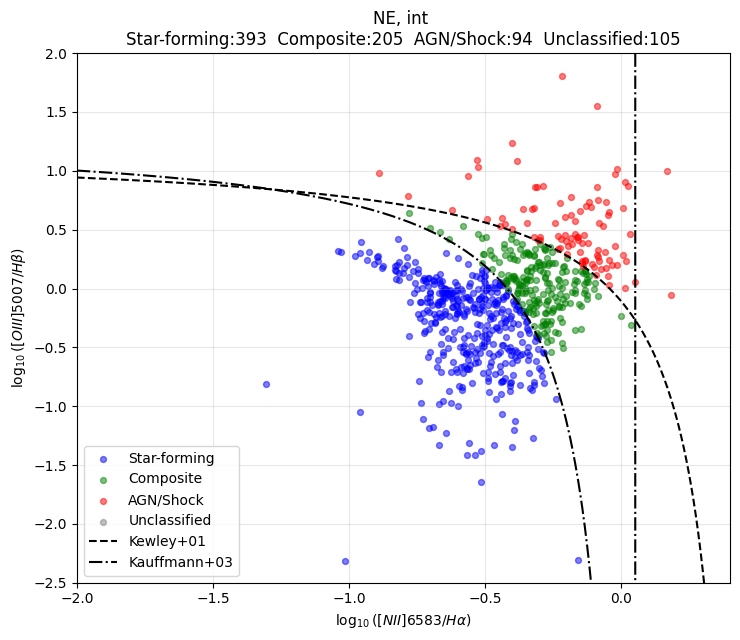

In [17]:
# Compute BPT points

prefix = 'int'
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, f"BPT_{field}_{prefix}.png"), dpi=150)
plt.show()

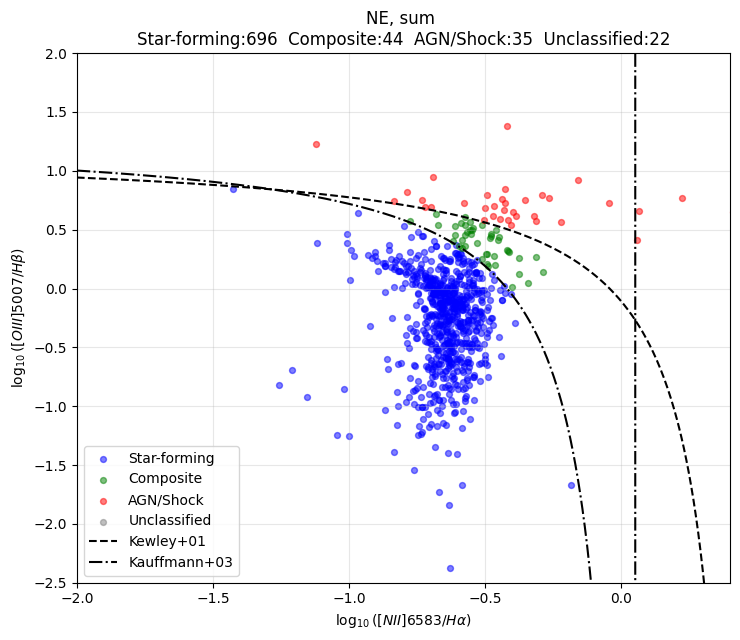

In [18]:
# Compute BPT points

prefix = 'sum'
x_raw, y_raw = merged_df[f'log_NII_Ha_{prefix}_dered'].to_numpy(dtype=float), merged_df[f'log_OIII_Hb_{prefix}_dered'].to_numpy(dtype=float)
# x_bg,  y_bg  = bpt_xy(merged_df, use_bgsub=True)

# Demarcation curves (classic BPT)
x_curve = np.linspace(-2.0, 0.6, 600)
kewley = 0.61 / (x_curve - 0.47) + 1.19      # Kewley+2001
kauff  = 0.61 / (x_curve - 0.05) + 1.30      # Kauffmann+2003

# ---- Plot: overlay raw vs corrected in one figure ----
plt.figure(figsize=(7.5, 6.5))

classes = ["Star-forming", "Composite", "AGN/Shock", "Unclassified"]
colors = ['blue', 'green', 'red', 'grey']
for cls in classes:
    mask = (merged_df[f'BPT_class_{prefix}_dered'] == cls)
    plt.scatter(x_raw[mask], y_raw[mask], s=18, alpha=0.5, label=cls, color=colors[classes.index(cls)])
# #color by BPT class
# plt.scatter(x_raw[merged_df['raw_BPT_class'] == 'star-forming'], 
#             y_raw[merged_df['raw_BPT_class'] == 'star-forming'], s=18, alpha=0.5, label="Star-forming")
# # plt.scatter(x_bg,  y_bg,  s=18, alpha=0.5, label="Background-subtracted (edge threshold)")

plt.plot(x_curve, kewley, linestyle="--", label="Kewley+01", color = 'k')
plt.plot(x_curve, kauff,  linestyle="-.", label="Kauffmann+03", color = 'k')

plt.xlabel(r'$\log_{10}([NII]6583 / H\alpha)$')
plt.ylabel(r'$\log_{10}([OIII]5007 / H\beta)$')
plt.title(f"{field}, {prefix} \nStar-forming:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Star-forming'])}  Composite:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Composite'])}  AGN/Shock:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'AGN/Shock'])}  Unclassified:{len(merged_df[merged_df[f'BPT_class_{prefix}_dered'] == 'Unclassified'])}")

plt.xlim(-2, 0.4)
plt.ylim(-2.5, 2)
plt.grid(alpha=0.3)
plt.legend(frameon=True)
plt.tight_layout()
plt.savefig(os.path.join(figure_dir, f"BPT_{field}_{prefix}.png"), dpi=150)
plt.show()

In [19]:
def plot_field_overlay_halpha_peaks_zoi_boundaries(
    catalog_df,
    ha_fits_path,
    zoi_label_map,
    boundary_label_map,
    field_name=None,
    x_col="x",
    y_col="y",
    region_label_col="zoi_center_label",
    region_id_col="region_id",
    xlim=None,
    ylim=None,
    show_peaks=True,
    show_zoi=True,
    show_boundaries=True,
    peaks_kwargs=None,
    zoi_color="cyan",
    boundary_color="magenta",
    zoi_lw=0.8,
    boundary_lw=1.1,
    alpha_zoi=0.65,
    alpha_boundary=0.9,
    # NEW: LogNorm controls
    ha_percentiles=(5, 99),         # global vmin/vmax percentiles (positive pixels only)
    use_local_lognorm=False,        # if True and xlim/ylim provided -> compute per-view norm
    local_percentiles=(3.0, 99.7),  # per-view percentiles (positive pixels only)
    min_pos_pixels=20,              # minimum positive pixels required to trust local percentiles
    eps_pos=None,                   # epsilon floor for vmin (defaults to nextafter(0,1))
    savepath=None,
    line = 'Halpha'
):
    """
    Overplot peaks + ZOI outlines + boundary outlines on the Halpha map, using LogNorm scaling.

    Parameters
    ----------
    catalog_df : pandas.DataFrame
        Must include x_col/y_col; should include region_label_col (integer ZOI label at center).
    ha_fits_path : str
        Path to Halpha FITS.
    zoi_label_map : 2D array
        Integer-labeled ZOI map (0 outside).
    boundary_label_map : 2D array
        Integer-labeled boundary map (0 outside).
    field_name : str
        Optional display name.
    xlim, ylim : (min,max) or None
        Plot limits in pixel coordinates.
    ha_percentiles : (lo, hi)
        Percentiles used for global LogNorm vmin/vmax (positive finite pixels only).
    use_local_lognorm : bool
        If True and xlim/ylim are given, compute per-view LogNorm using local_percentiles,
        falling back to global if too few positive pixels.
    """

    import numpy as np
    import matplotlib.pyplot as plt
    from astropy.io import fits
    from matplotlib.colors import LogNorm

    # Lazy import so this cell works even if skimage isn't installed elsewhere
    try:
        from skimage.segmentation import find_boundaries  # noqa: F401  (kept as in your original)
    except Exception as e:
        raise ImportError(
            "This plotting function requires scikit-image. "
            "Install with: pip install scikit-image"
        ) from e

    if eps_pos is None:
        eps_pos = np.nextafter(0, 1)

    # --- Field name ---
    if field_name is None:
        field_name = (
            str(catalog_df.get("field", ["Field"]).iloc[0])
            if hasattr(catalog_df, "iloc")
            else "Field"
        )

    # --- Load Halpha map ---
    ha = fits.getdata(ha_fits_path)
    ha = np.where(np.isfinite(ha), ha, np.nan)

    # --- Compute GLOBAL LogNorm vmin/vmax from positive finite pixels ---
    valid_pos = ha[np.isfinite(ha) & (ha > 0)]
    if valid_pos.size == 0:
        raise ValueError("Hα map has no positive finite values for LogNorm.")

    vmin_global = np.nanpercentile(valid_pos, ha_percentiles[0])
    vmax_global = np.nanpercentile(valid_pos, ha_percentiles[1])

    # Fallback if percentiles are degenerate
    if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
        vmin_global, vmax_global = np.nanmin(valid_pos), np.nanmax(valid_pos)
        if (not np.isfinite(vmin_global)) or (not np.isfinite(vmax_global)) or (vmax_global <= vmin_global):
            raise ValueError("Failed to compute valid global vmin/vmax for Hα.")

    vmin_global = max(vmin_global, eps_pos)

    def _local_lognorm(arr2d):
        """Compute a per-view LogNorm using positive finite pixels, fallback to global."""
        pos = arr2d[np.isfinite(arr2d) & (arr2d > 0)]
        vmin_loc, vmax_loc = vmin_global, vmax_global

        if pos.size >= min_pos_pixels:
            lo = np.nanpercentile(pos, local_percentiles[0])
            hi = np.nanpercentile(pos, local_percentiles[1])
            if np.isfinite(lo) and np.isfinite(hi) and hi > lo:
                vmin_loc, vmax_loc = lo, hi

        vmin_loc = max(vmin_loc, eps_pos)
        if (not np.isfinite(vmax_loc)) or (vmax_loc <= vmin_loc):
            vmax_loc = vmin_loc * 1.01
        return LogNorm(vmin=vmin_loc, vmax=vmax_loc)

    # Decide norm: global or local-per-view
    norm = LogNorm(vmin=vmin_global, vmax=vmax_global)
    if use_local_lognorm and (xlim is not None) and (ylim is not None):
        # Clip indices safely and compute norm on that view
        x0, x1 = sorted([int(np.floor(xlim[0])), int(np.ceil(xlim[1]))])
        y0, y1 = sorted([int(np.floor(ylim[0])), int(np.ceil(ylim[1]))])
        x0 = max(0, x0); y0 = max(0, y0)
        x1 = min(ha.shape[1], x1); y1 = min(ha.shape[0], y1)
        view = ha[y0:y1, x0:x1]
        if view.size > 0:
            norm = _local_lognorm(view)

    # --- Ensure integer maps ---
    zoi_int = np.rint(np.nan_to_num(zoi_label_map, nan=0)).astype(np.int32)
    bnd_int = np.rint(np.nan_to_num(boundary_label_map, nan=0)).astype(np.int32)

    # --- Figure ---
    fig, ax = plt.subplots(figsize=(10, 10 * ha.shape[0] / ha.shape[1]))

    # Make NaNs white
    cmap_gray = plt.get_cmap("gray").copy()
    cmap_gray.set_bad(color="white")

    # IMPORTANT CHANGE: show ha (linear) with LogNorm (not log10(ha))
    im = ax.imshow(ha, origin="lower", cmap=cmap_gray, norm=norm)

    # --- Overlay outlines ---
    labels_from_catalog = None
    if hasattr(catalog_df, "columns") and (region_label_col in catalog_df.columns):
        labels_from_catalog = sorted({
            int(v) for v in catalog_df[region_label_col].values
            if np.isfinite(v) and int(v) > 0
        })

    if labels_from_catalog and len(labels_from_catalog) > 0:
        labels = labels_from_catalog
    else:
        labels = sorted([int(v) for v in np.unique(bnd_int) if v > 0])

    # NOTE: your original code contours the entire label maps at 0.5, which is fine.
    if show_zoi and np.isfinite(zoi_int).any():
        edge = np.nan_to_num(zoi_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[zoi_color], linewidths=zoi_lw,
                   origin="lower", zorder=1, alpha=alpha_zoi)
    if show_boundaries and np.isfinite(bnd_int).any():
        edge = np.nan_to_num(bnd_int, nan=0.0)
        ax.contour(edge, levels=[0.5], colors=[boundary_color], linewidths=boundary_lw,
                   origin="lower", zorder=1, alpha=alpha_boundary)

    # --- Plot peak centers ---
    if show_peaks:
        if peaks_kwargs is None:
            peaks_kwargs = dict(marker="+", s=18, linewidths=0.8, alpha=0.85)
        xs = catalog_df[x_col].astype(float).values
        ys = catalog_df[y_col].astype(float).values
        ax.scatter(xs, ys, color="k", **peaks_kwargs, label="Peaks")

    # --- Colorbar ---
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(r"Flux (LogNorm)")

    # --- Aesthetics ---
    ax.set_title(f"{line} with Peaks, ZOI (cyan), Boundaries (magenta)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_facecolor("white")
    fig.patch.set_facecolor("white")

    # Limits
    if xlim is not None:
        ax.set_xlim(*xlim)
    if ylim is not None:
        ax.set_ylim(*ylim)

    if show_peaks:
        ax.legend(loc="upper right", frameon=True)

    plt.tight_layout()

    if savepath:
        plt.savefig(savepath, bbox_inches="tight", dpi=300, facecolor="white")
        print(f"[done] Saved overlay plot: {savepath}")

    plt.show()
    plt.close(fig)
    return fig, ax

Creating overlay plot for ha with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_ha_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_ha_overlay.png


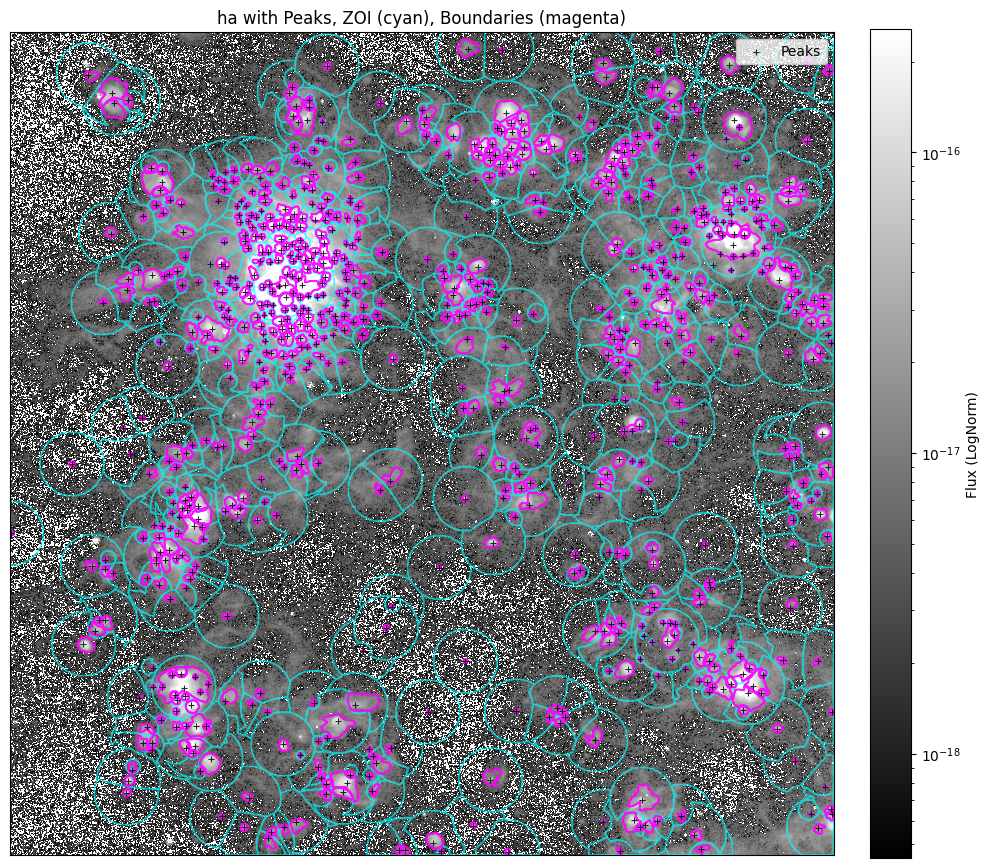

Creating overlay plot for hb with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_hb_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_hb_overlay.png


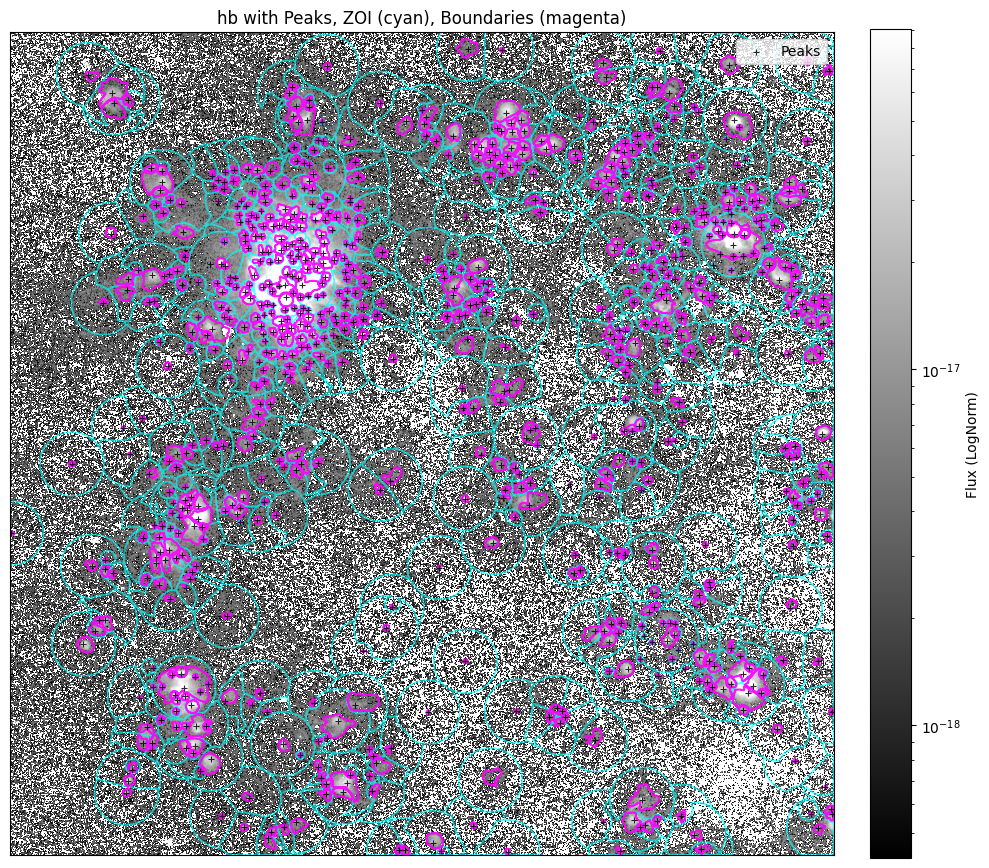

Creating overlay plot for oiii5007 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_oiii5007_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_oiii5007_overlay.png


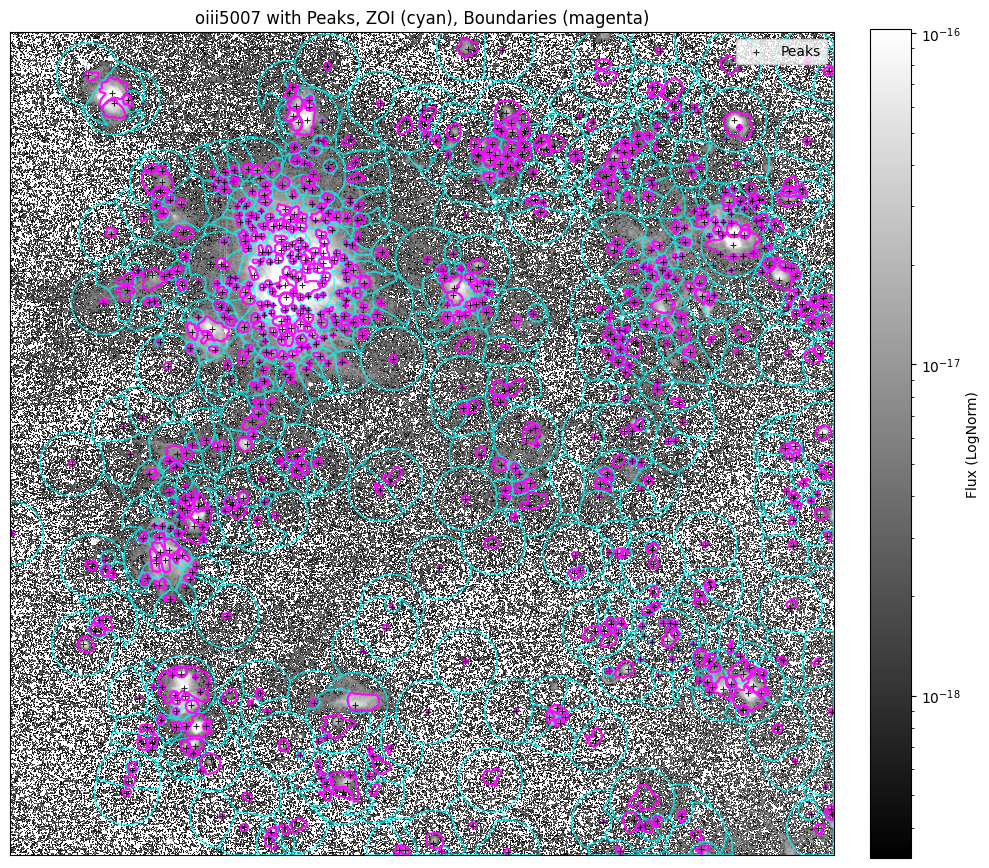

Creating overlay plot for sii6716 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_sii6716_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_sii6716_overlay.png


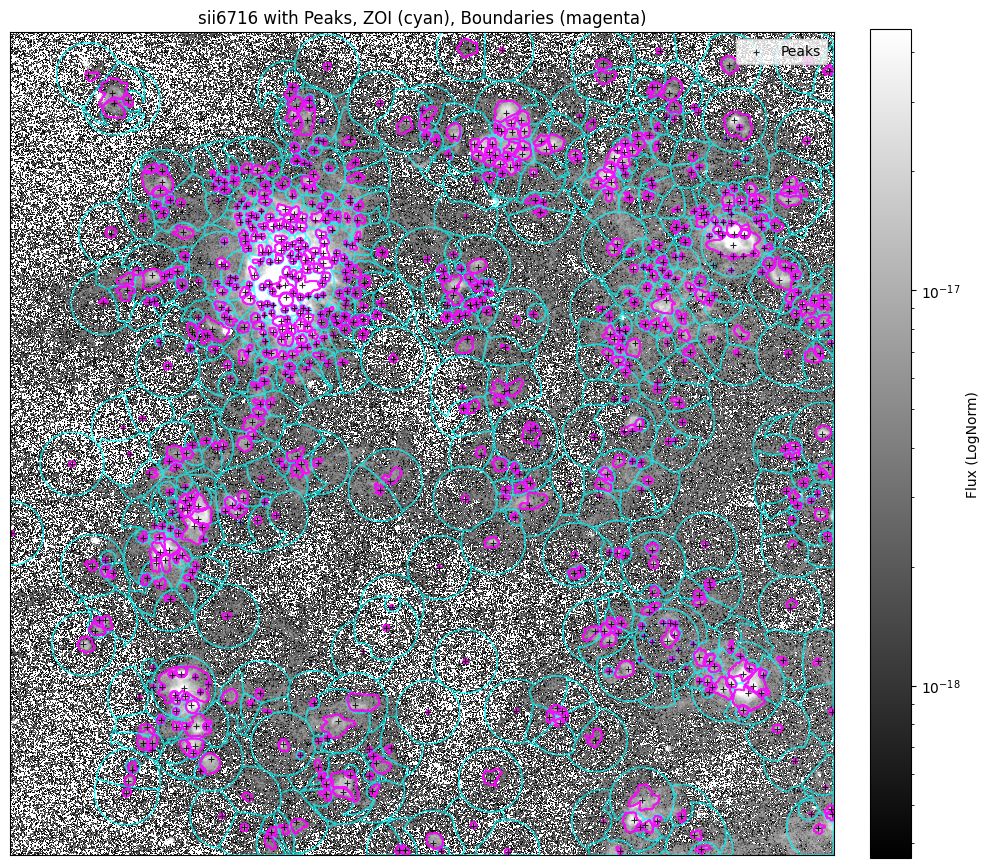

Creating overlay plot for sii6731 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_sii6731_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_sii6731_overlay.png


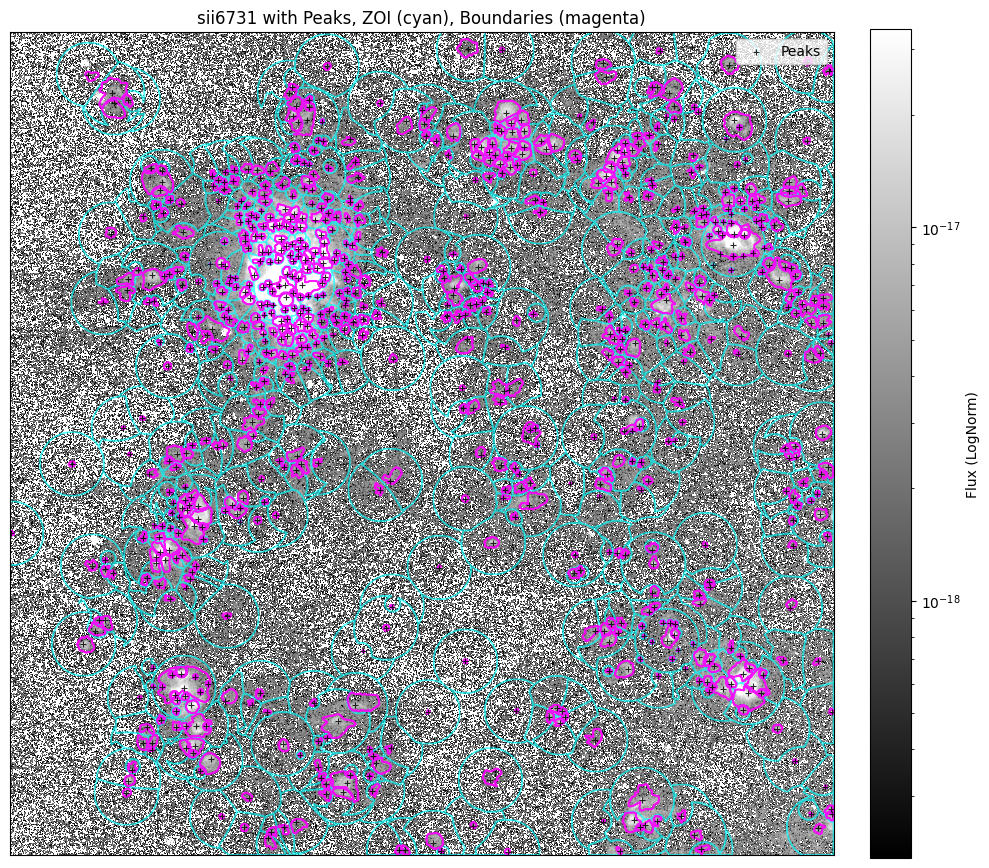

Creating overlay plot for nii6584 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_nii6584_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_nii6584_overlay.png


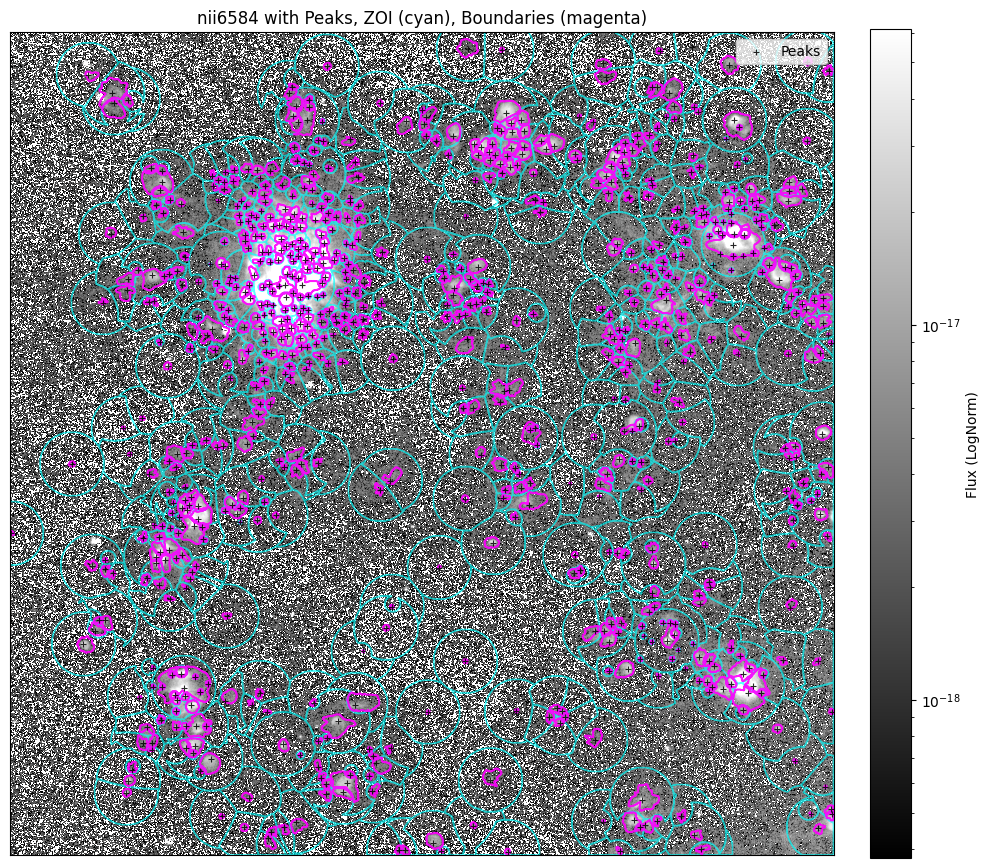

Creating overlay plot for oii3727 with peaks, ZOI, and boundaries; saving to: plots/individual_field_flux_plots/NE/M33_NE_oii3727_overlay.png


[done] Saved overlay plot: plots/individual_field_flux_plots/NE/M33_NE_oii3727_overlay.png


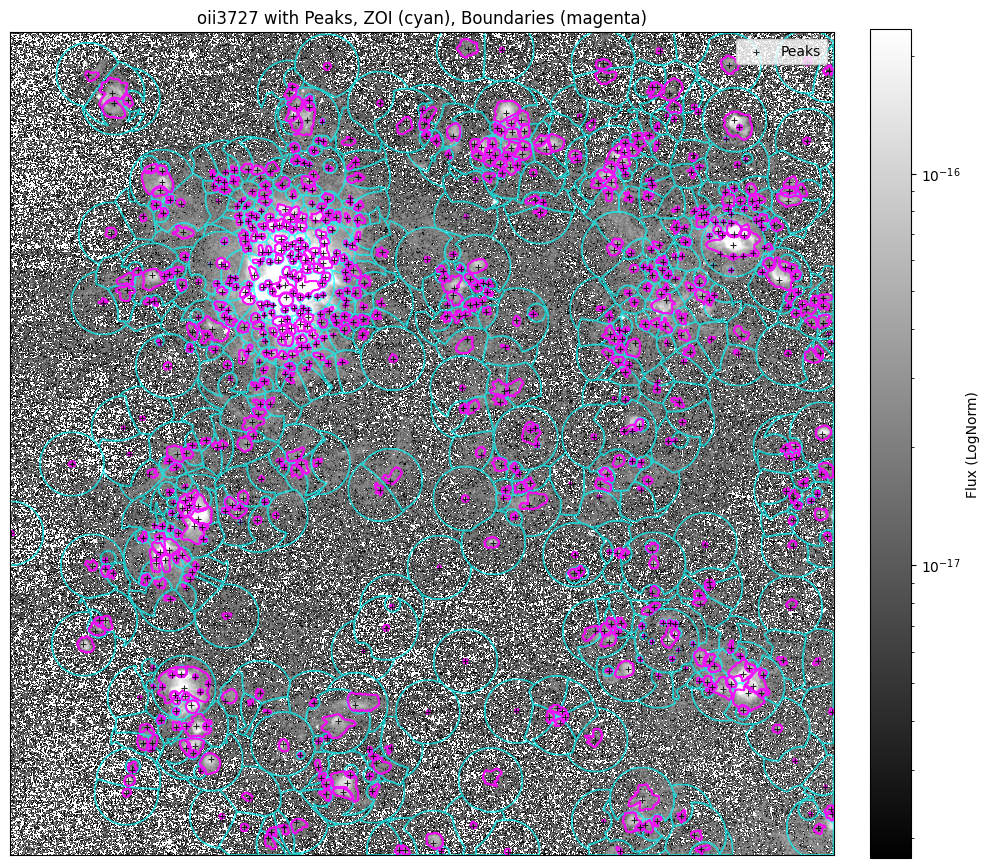

In [20]:
"""
Runs the full-field overlay plot using the variables created earlier in the notebook.
"""
# Example usage (matches your earlier variables):
# - combined: your peak catalog dataframe
# - halpha_fits: Halpha FITS path
# - zoi_label: ZOI label map (2D)
# - boundary_label: final boundary label map (2D)

# Optional: zoom limits (set to None to show full frame)
xlim = (50, 2000)
ylim = (50, 2000)

contzoi_fits = f"ZOI_maps/ZOI_map_{max_zoi}pc/ContZoI_map_{field}.fits"
contzoi_label = fits.getdata(contzoi_fits)
cont_map_fits = f"Boundary_maps/Boundary_map_100pc/ContDomain_map_{field}.fits"
cont_map = fits.getdata(cont_map_fits)

plot_maps_dir = f"plots/individual_field_flux_plots/{field}"
os.makedirs(plot_maps_dir, exist_ok=True)
folder = f"../M33-Maps-Calibrated/M33-{field}/"
for line in ["ha", "hb", "oiii5007", "sii6716", "sii6731", "nii6584", "oii3727"]:
    line_fits = f"{folder}M33{field}-{line}flux.fits"
    line_data = fits.getdata(line_fits)
    line_data = np.where(np.isfinite(line_data), line_data, np.nan)
    plot_overlay_path = f"{plot_maps_dir}/M33_{field}_{line}_overlay.png"
    print(f"Creating overlay plot for {line} with peaks, ZOI, and boundaries; saving to: {plot_overlay_path}")
    plot_field_overlay_halpha_peaks_zoi_boundaries(
        catalog_df=merged_df,
        ha_fits_path=line_fits,
        zoi_label_map=contzoi_label,
        boundary_label_map=cont_map,
        field_name=f"M33 {field}",
        x_col="x",
        y_col="y",
        region_label_col="zoi_center_label",
        xlim=xlim,
        ylim=ylim,
        show_peaks=True,
        show_zoi=True,
        show_boundaries=True,
        savepath=plot_overlay_path,
        line = line
    )